# Topographically Aware U-Net for Post-Fire Structural Damage Mapping: 2025 Los Angeles Palisades Fire

**Tess Vu, Luciano Lu, Ming Cao**

**Submitted:** April 2026 | **Course:** MUSA 650 Remote Sensing

## Problem Definition & Technical Justification

The January 2025 Palisades Fire burned through steep, chaparral-dense canyons in the Santa Monica Mountains directly into the densely populated residential grid of Pacific Palisades, a textbook Wildland-Urban Interface (WUI) disaster. After a fire like this, civic agencies such as the LA County Department of Regional Planning, local utility providers, and environmental resilience teams need to know which structures were destroyed so they can allocate rebuilding resources, estimate insurance liabilities, and deploy soil stabilization crews. The current workflow relies on labor-intensive field inspections by CAL FIRE assessors (the DINS program), which can take weeks to complete across thousands of structures.

This project builds a pixel-level damage prediction map from freely available satellite imagery and ancillary data, producing a binary segmentation mask that flags 20-meter pixels as damaged or intact. The specific output is a raster layer that municipal planners can overlay on property parcels for immediate triage before complete field assessments are available.

### What the Model Learns

The model learns whether the combination of spectral burn signatures (elevated dNBR indicating vegetation and material loss, increased SWIR reflectance from ash and debris), topographic position (slope aspect relative to fire spread and winter sun angle), and infrastructure presence (building footprints) can predict the structural damage outcomes that trained CAL FIRE assessors recorded on the ground.

Semantic segmentation is the appropriate task type because planners need a spatially explicit map, not a tile-level classification. A model that labels an entire image tile as "damaged" provides no actionable spatial intelligence for parcel-level resource allocation.

### Anticipated Failures

The fire occurred in January when the sun sits low in the southern sky. North-facing slopes in the Santa Monica Mountains are cast in deep shadow during Sentinel-2 mid-morning overpasses, returning near-zero reflectance that mathematically mimics a severe burn scar. DEM-derived Aspect is fed explicitly into the model so the network can learn to distinguish shadow artifacts from genuine fire damage.

Destroyed structures represent a small fraction of total pixels within the fire perimeter. Most of the burn area is vegetation, not buildings. The model uses a combined Dice + Focal loss function and oversamples training patches containing damaged structures to prevent it from defaulting to "predict intact everywhere."

Using dNBR to both generate labels and serve as an input feature would let the model learn a trivial threshold rather than genuine predictive relationships. Labels are constructed exclusively from CAL FIRE DINS field inspection points, keeping all spectral indices strictly on the feature side.

### Observed Failure Modes in Practice

The topographic shadow concern was confirmed during preprocessing because north-facing canyon walls showed elevated dNBR values in areas where no structures existed and no burn damage was recorded. Including Aspect as an explicit channel allows the model access to this context.

Class imbalance proved more extreme than anticipated. DINS damage pixels represent roughly 4% of pixels within the AOI, yielding imbalance ratios exceeding 23:1. Even with Dice + Focal loss and patch oversampling, both models showed sensitivity to fold composition, with per-fold F1 varying meaningfully across the 5-fold spatial CV.

The 20-meter Sentinel-2 resolution is a practical constraint: a single pixel covers 400 m², often larger than individual residential structures, which limits the model to regional damage signal rather than parcel-level precision.

## Methodological Precedent

Three studies informed the design decisions in this project.

**Ngoua Ndong Avele & Goryainov (2025)** used Random Forest to classify fire severity over Eaton Canyon, California, fusing Sentinel-2 spectral indices (dNBR, RBR, RdNBR) with Sentinel-1 SAR data. Their fused multi-index approach outperformed any single index alone, which validates the decision here to build a multi-channel tensor combining dNBR with raw band reflectances and ancillary layers rather than relying on dNBR as a standalone predictor. They also noted that optimal burn severity thresholds are ecosystem-dependent and empirically determined, reinforcing the choice to avoid hard-coded dNBR thresholds in label construction.

**Pinto et al. (2020)** applied a U-Net with a VGG19 encoder for burned area mapping using temporal sequences of satellite imagery. They compared automated labeling methods against official fire products and evaluated performance with F1-Score and stratified K-Fold cross-validation. Their finding that independently validated ground truth outperformed algorithm-derived labels directly supports using CAL FIRE DINS field assessments rather than Otsu-thresholded dNBR as the target mask. Their use of stratified spatial folds also informed the block-based spatial cross-validation strategy used here.

**Mayer et al. (2021)** proposed a U-Net-based architecture (BA-Net) for surface water mapping from Sentinel-1, evaluated with the Dice Coefficient. The authors explicitly noted that the absence of environmental variables like land cover and topography limited their ability to explain spatial variation in model performance. This identified gap directly motivated incorporating DEM Aspect into the feature tensor to address topographic shadow artifacts in the WUI environment of the Santa Monica Mountains.

Across these studies there is limited work using field-collected structural damage assessments (like DINS) as ground truth for remote sensing segmentation, or on whether feeding DEM Aspect explicitly improves WUI structural damage prediction where this project addresses both gaps.

## Data & Preprocessing

This section documents the complete data pipeline for constructing the 8-channel feature tensor and DINS-based binary target mask. The pipeline fuses Sentinel-2 optical imagery, USGS 3DEP topographic derivatives, Microsoft building footprints, and CAL FIRE field inspection points, all aligned to a common 20-meter UTM grid.

**Data sources:**
- [Sentinel-2 L2A](https://earth-search.aws.element84.com/v1) surface reflectance via Element 84 Earth Search STAC API
- [USGS 3DEP 10m DEM](https://planetarycomputer.microsoft.com/api/stac/v1) via Planetary Computer STAC API
- [Microsoft US Building Footprints](https://github.com/microsoft/USBuildingFootprints) filtered to LA County
- [CAL FIRE DINS Palisades](https://gis.data.cnra.ca.gov/datasets/CALFIRE-Forestry::cal-fire-damage-inspection-dins-data/explore?filters=eyJJTkNJREVOVE5BTUUiOlsiUGFsaXNhZGVzIl19&location=34.063668%2C-118.567981%2C12) field damage inspection points
- [NIFC FIRIS Palisades Perimeter](https://data.lacounty.gov/datasets/lacounty::palisades-and-eaton-dissolved-fire-perimeters-2025/explore?layer=1&location=34.076488%2C-118.572565%2C11) for the AOI boundary

### Environment Setup and Dependencies

In [ ]:
# COLAB DRIVE MOUNT
# Uncomment if running in Google Colab.
#from google.colab import drive
#drive.mount("/content/drive")
#import os
#os.chdir("/content/drive/MyDrive/Colab Notebooks/wui_fires")

Mounted at /content/drive


In [ ]:
#!pip install odc-stac geopandas folium contextily rioxarray pystac-client planetary-computer scikit-image rioxarray

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.0/159.0 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.6/58.6 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.5/208.5 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 22.3 MB/s eta 0:00:00
  Attempting uninstall: xarray
    Found existing installation: xarray 2025.12.0
    Uninstalling xarray-2025.12.0:
      Successfully uninstalled xarray-2025.12.0


In [ ]:
# CORE LIBRARIES
import os
import json
import warnings
import geopandas as gpd
import numpy as np
import odc.stac
import folium
import rioxarray
import contextily as ctx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from pyproj import Transformer
from IPython.display import Image
from rasterio.errors import NotGeoreferencedWarning

# STAC AND ODC MODULES
import planetary_computer
from pystac_client import Client
from rasterio import features
from rasterio.transform import from_bounds
from shapely.geometry import box

# SKIMAGE FOR OTSU THRESHOLDING
from skimage.filters import threshold_otsu

# ADDITIONAL LIBRARIES FOR MODELING
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, jaccard_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler

# DEEP LEARNING LIBRARIES
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, Dropout, concatenate,
    Conv2DTranspose, BatchNormalization, Activation
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.losses import BinaryFocalCrossentropy
from tensorflow.keras import backend as K

In [23]:
# DISPLAY AT 150 DPI AND SAVE AT 300 DPI
plt.rcParams["figure.dpi"] = 100
plt.rcParams["savefig.dpi"] = 300

# CREATE FOLDER FOR FINAL PROJECT
final_project_path = Path("final_project_files")
final_project_path.mkdir(parents=True, exist_ok=True)

# CREATE FOLDER FOR IMAGES
images_path = Path("final_project_files/images")
images_path.mkdir(parents=True, exist_ok=True)

### Study Area and Temporal Range

The Palisades Fire ignited on January 7, 2025, and burned through steep, chaparral-dense canyons in the Santa Monica Mountains directly into densely populated residential areas of Pacific Palisades. The bounding box encompasses the primary fire impact zone within the Wildland-Urban Interface (WUI).

In [24]:
# STUDY AREA BOUNDING BOX
# Bounding box covers Pacific Palisades fire perimeter in WGS84 coordinates.
# [min_longitude, min_latitude, max_longitude, max_latitude].
palisades_bbox = [-118.717856, 33.998365, -118.466523, 34.139426]

# TEMPORAL RANGE
# Pre-fire window captures baseline conditions before January 7, 2025.
pre_fire_start = "2024-12-01"
pre_fire_end = "2025-01-06"

# Post-fire window captures burn scar conditions after fire containment.
post_fire_start = "2025-02-01"
post_fire_end = "2025-02-28"

# TARGET CRS FOR ALL DATA
# UTM Zone 11N is projected coordinate system for Los Angeles.
target_crs = "EPSG:32611"

# TARGET SPATIAL RESOLUTION
# Sentinel-2 NIR band (B8A) has 20m native resolution.
target_resolution = 20

### Satellite Data via STAC API

This step queries the Element 84 Earth Search STAC API to retrieve Sentinel-2 Level-2A surface reflectance imagery. The required bands are B8A (Near-Infrared at 20m) and B12 (Shortwave-Infrared at 20m) for Normalized Burn Ratio calculation, along with SCL (Scene Classification Layer) for cloud and shadow masking.

In [25]:
# CONNECT TO ELEMENT 84 EARTH SEARCH STAC CATALOG
# Element 84 provides open access to Sentinel-2 L2A data without authentication.
stac_catalog_url = "https://earth-search.aws.element84.com/v1"
catalog = Client.open(stac_catalog_url)

In [26]:
# PRE-FIRE SENTINEL-2 IMAGERY
# Cloud cover threshold set to 30% to balance data availability and quality.
pre_fire_search = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=palisades_bbox,
    datetime=f"{pre_fire_start}/{pre_fire_end}",
    query={"eo:cloud_cover": {"lt": 30}},
)

pre_fire_items = list(pre_fire_search.item_collection())

print(f"Pre-Fire Scenes: {len(pre_fire_items)}")

# SCENE METADATA
for item in pre_fire_items:
    cloud_cover = item.properties.get("eo:cloud_cover", "N/A")
    print(
        f"Scene: {item.id} | Date: {item.datetime.strftime('%Y-%m-%d')} | Cloud Cover: {cloud_cover:.1f}%"
    )

Pre-Fire Scenes: 3
Scene: S2A_11SLT_20250102_0_L2A | Date: 2025-01-02 | Cloud Cover: 3.0%
Scene: S2B_11SLT_20241218_0_L2A | Date: 2024-12-18 | Cloud Cover: 0.0%
Scene: S2A_11SLT_20241213_0_L2A | Date: 2024-12-13 | Cloud Cover: 21.5%


In [27]:
# POST-FIRE SENTINEL-2 IMAGERY
# Post-fire scenes capture burn scar and destroyed infrastructure.
post_fire_search = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=palisades_bbox,
    datetime=f"{post_fire_start}/{post_fire_end}",
    query={"eo:cloud_cover": {"lt": 30}},
)

post_fire_items = list(post_fire_search.item_collection())

print(f"Post-Fire Scenes: {len(post_fire_items)}")

# SCENE METADATA
for item in post_fire_items:
    cloud_cover = item.properties.get("eo:cloud_cover", "N/A")
    print(
        f"Scene: {item.id} | Date: {item.datetime.strftime('%Y-%m-%d')} | Cloud Cover: {cloud_cover:.1f}%"
    )

Post-Fire Scenes: 2
Scene: S2C_11SLT_20250221_0_L2A | Date: 2025-02-21 | Cloud Cover: 5.0%
Scene: S2C_11SLT_20250201_0_L2A | Date: 2025-02-01 | Cloud Cover: 15.8%


In [28]:
pre_fire_items[0]

<Item id=S2A_11SLT_20250102_0_L2A>

In [29]:
Image(url=pre_fire_items[0].assets["thumbnail"].href)

In [30]:
# SELECT OPTIMAL SCENES
# Select scene with lowest cloud cover from both.
def select_best_scene(items):
    """Select the scene with minimum cloud cover from a list of STAC items."""
    if not items:
        return None
    sorted_items = sorted(items, key=lambda x: x.properties.get("eo:cloud_cover", 100))
    return sorted_items[0]


best_pre_fire = select_best_scene(pre_fire_items)
best_post_fire = select_best_scene(post_fire_items)

print(f"Pre-Fire Scene: {best_pre_fire.id if best_pre_fire else 'None found'}")
print(f"Post-Fire Scene: {best_post_fire.id if best_post_fire else 'None found'}")

Pre-Fire Scene: S2B_11SLT_20241218_0_L2A
Post-Fire Scene: S2C_11SLT_20250221_0_L2A


In [31]:
# PRE-FIRE BANDS INTO XARRAY
# Required bands: B8A (NIR 20m), B12 (SWIR 20m), SCL (Scene Classification).
required_bands = ["nir08", "swir16", "scl"]

pre_fire_data = odc.stac.load(
    [best_pre_fire],
    bands=required_bands,
    bbox=palisades_bbox,
    resolution=target_resolution,
    crs=target_crs,
    chunks={"x": 512, "y": 512},
)

print(pre_fire_data)

<xarray.Dataset> Size: 5MB
Dimensions:      (y: 801, x: 1173, time: 1)
Coordinates:
  * y            (y) float64 6kB 3.779e+06 3.779e+06 ... 3.763e+06 3.763e+06
  * x            (x) float64 9kB 3.414e+05 3.414e+05 ... 3.648e+05 3.648e+05
  * time         (time) datetime64[ns] 8B 2024-12-18T18:45:03.766000
    spatial_ref  int32 4B 32611
Data variables:
    nir08        (time, y, x) uint16 2MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    swir16       (time, y, x) uint16 2MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    scl          (time, y, x) uint8 940kB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>


In [32]:
pre_fire_data

<xarray.Dataset> Size: 5MB
Dimensions:      (y: 801, x: 1173, time: 1)
Coordinates:
  * y            (y) float64 6kB 3.779e+06 3.779e+06 ... 3.763e+06 3.763e+06
  * x            (x) float64 9kB 3.414e+05 3.414e+05 ... 3.648e+05 3.648e+05
  * time         (time) datetime64[ns] 8B 2024-12-18T18:45:03.766000
    spatial_ref  int32 4B 32611
Data variables:
    nir08        (time, y, x) uint16 2MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    swir16       (time, y, x) uint16 2MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    scl          (time, y, x) uint8 940kB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>

In [33]:
# POST-FIRE BANDS INTO XARRAY
# Same band configuration as pre-fire for consistent analysis.
post_fire_data = odc.stac.load(
    [best_post_fire],
    bands=required_bands,
    bbox=palisades_bbox,
    resolution=target_resolution,
    crs=target_crs,
    chunks={"x": 512, "y": 512},
)

print(post_fire_data)

<xarray.Dataset> Size: 5MB
Dimensions:      (y: 801, x: 1173, time: 1)
Coordinates:
  * y            (y) float64 6kB 3.779e+06 3.779e+06 ... 3.763e+06 3.763e+06
  * x            (x) float64 9kB 3.414e+05 3.414e+05 ... 3.648e+05 3.648e+05
  * time         (time) datetime64[ns] 8B 2025-02-21T18:45:25.463000
    spatial_ref  int32 4B 32611
Data variables:
    nir08        (time, y, x) uint16 2MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    swir16       (time, y, x) uint16 2MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    scl          (time, y, x) uint8 940kB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>


In [34]:
post_fire_data

<xarray.Dataset> Size: 5MB
Dimensions:      (y: 801, x: 1173, time: 1)
Coordinates:
  * y            (y) float64 6kB 3.779e+06 3.779e+06 ... 3.763e+06 3.763e+06
  * x            (x) float64 9kB 3.414e+05 3.414e+05 ... 3.648e+05 3.648e+05
  * time         (time) datetime64[ns] 8B 2025-02-21T18:45:25.463000
    spatial_ref  int32 4B 32611
Data variables:
    nir08        (time, y, x) uint16 2MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    swir16       (time, y, x) uint16 2MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    scl          (time, y, x) uint8 940kB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>

In [35]:
# SENTINEL-2 SCENE CLASSIFICATION CLOUD MASK
# Valid SCL Classes: 2 = Dark Area Pixels, 4 = Vegetation, 5 = Bare Soils,
# 6 = Water, 7 = Unclassified, 11 = Snow/Ice.
# Classes to Mask: 0 = No Data, 1 = Saturated, 3 = Cloud Shadow,
# 8 = Cloud Medium, 9 = Cloud High, 10 = Thin Cirrus.
valid_scl_classes = [2, 4, 5, 6, 7, 11]


def apply_scl_mask(data, valid_classes):
    """Apply SCL-based cloud and shadow mask to optical bands."""
    scl = data["scl"].squeeze()
    valid_mask = scl.isin(valid_classes)
    masked_nir = data["nir08"].where(valid_mask)
    masked_swir = data["swir16"].where(valid_mask)
    return masked_nir.squeeze(), masked_swir.squeeze(), valid_mask


# APPLY MASK TO PRE-FIRE DATA
pre_nir, pre_swir, pre_valid_mask = apply_scl_mask(pre_fire_data, valid_scl_classes)

# APPLY MASK TO POST-FIRE DATA
post_nir, post_swir, post_valid_mask = apply_scl_mask(post_fire_data, valid_scl_classes)

print(f"Pre-Fire Valid Pixel %: {float(pre_valid_mask.mean()) * 100:.1f}%")
print(f"Post-Fire Valid Pixel %: {float(post_valid_mask.mean()) * 100:.1f}%")

Pre-Fire Valid Pixel %: 100.0%
Post-Fire Valid Pixel %: 96.0%


### Calculate Normalized Burn Ratio and Delta NBR

The Normalized Burn Ratio (NBR) is calculated using Near-Infrared (NIR) and Shortwave-Infrared (SWIR) bands. The delta NBR (dNBR) quantifies the change in burn severity between pre-fire and post-fire conditions. Higher dNBR values indicate more severe burn damage.

In [36]:
# NORMALIZED BURN RATIO CALCULATION FUNCTION
# NBR = (NIR - SWIR) / (NIR + SWIR).
# Epsilon term prevents division by zero in dark or saturated pixels.
def calc_nbr(nir, swir, epsilon=1e-10):
    """Calculate Normalized Burn Ratio from NIR and SWIR bands."""
    nir = nir.astype(float)
    swir = swir.astype(float)
    nbr = (nir - swir) / (nir + swir + epsilon)
    return nbr


# PRE-FIRE NBR
nbr_pre = calc_nbr(pre_nir, pre_swir)

# POST-FIRE NBR
nbr_post = calc_nbr(post_nir, post_swir)

print(f"Pre-Fire NBR Range: [{float(nbr_pre.min()):.3f}, {float(nbr_pre.max()):.3f}]")
print(
    f"Post-Fire NBR Range: [{float(nbr_post.min()):.3f}, {float(nbr_post.max()):.3f}]"
)

Pre-Fire NBR Range: [-0.995, 0.996]
Post-Fire NBR Range: [-0.987, 0.682]


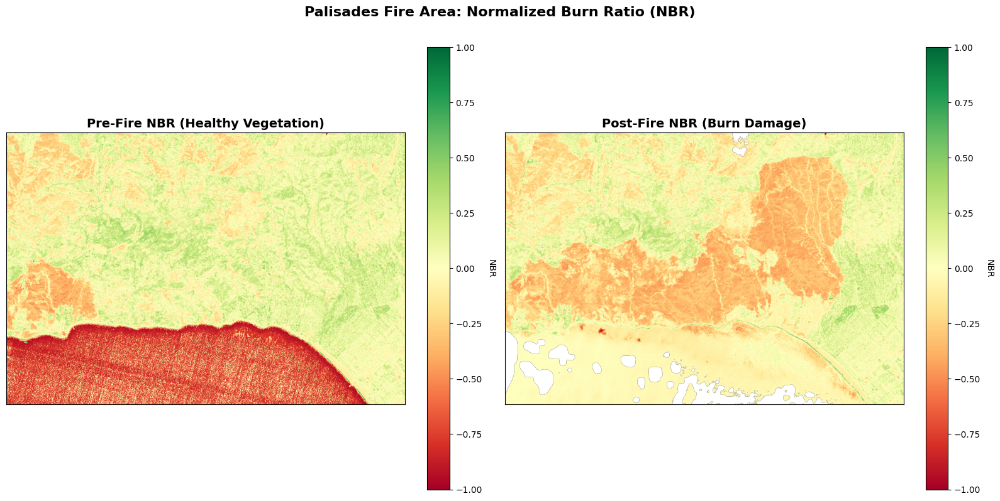

In [37]:
# Plot pre-fire and post-fire NBR side by side.
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Pre-fire NBR.
pre_fire_plot = axes[0].imshow(nbr_pre.values, cmap="RdYlGn", vmin=-1, vmax=1)
axes[0].set_title("Pre-Fire NBR (Healthy Vegetation)", fontsize=14, fontweight="bold")
axes[0].xaxis.set_visible(False)
axes[0].yaxis.set_visible(False)
cbar0 = plt.colorbar(pre_fire_plot, ax=axes[0], fraction=0.05)
cbar0.set_label("NBR", rotation=270, labelpad=15)

# Post-fire NBR.
post_fire_plot = axes[1].imshow(nbr_post.values, cmap="RdYlGn", vmin=-1, vmax=1)
axes[1].set_title("Post-Fire NBR (Burn Damage)", fontsize=14, fontweight="bold")
axes[1].xaxis.set_visible(False)
axes[1].yaxis.set_visible(False)
cbar1 = plt.colorbar(post_fire_plot, ax=axes[1], fraction=0.05)
cbar1.set_label("NBR", rotation=270, labelpad=15)

plt.suptitle(
    "Palisades Fire Area: Normalized Burn Ratio (NBR)",
    fontsize=16,
    fontweight="bold",
    y=1,
)
plt.tight_layout()
plt.savefig(
    "final_project_files/images/nbr_comparison.png", dpi=300, bbox_inches="tight"
)
plt.show()

![](dNBR_thresholds.png "USGS dNBR Thresholds")

In [38]:
# DELTA NORMALIZED BURN RATIO
# dNBR = NBR_pre - NBR_post.
# Positive dNBR indicates vegetation loss or burn damage.
# USGS dNBR Thresholds: High Regrowth = -0.500 - -0.251,
# Low Regrowth = -0.250 - -0.101, Unburned = -0.100 - 0.99,
# Low = 0.100 - 0.269, Moderate-Low = 0.270 - 0.439,
# Moderate-High = 0.44 - 0.659, High > 0.66.
dnbr = nbr_pre - nbr_post

# COMBINE VALID MASKS FROM BOTH TEMPORAL WINDOWS
# Pixels must be valid in both pre-fire and post-fire scenes.
combined_valid_mask = pre_valid_mask & post_valid_mask
dnbr_masked = dnbr.where(combined_valid_mask)

print(f"dNBR Range: [{float(dnbr_masked.min()):.3f}, {float(dnbr_masked.max()):.3f}]")
print(f"Combined Valid Pixel %: {float(combined_valid_mask.mean()) * 100:.1f}%")

dNBR Range: [-1.553, 1.212]
Combined Valid Pixel %: 96.0%


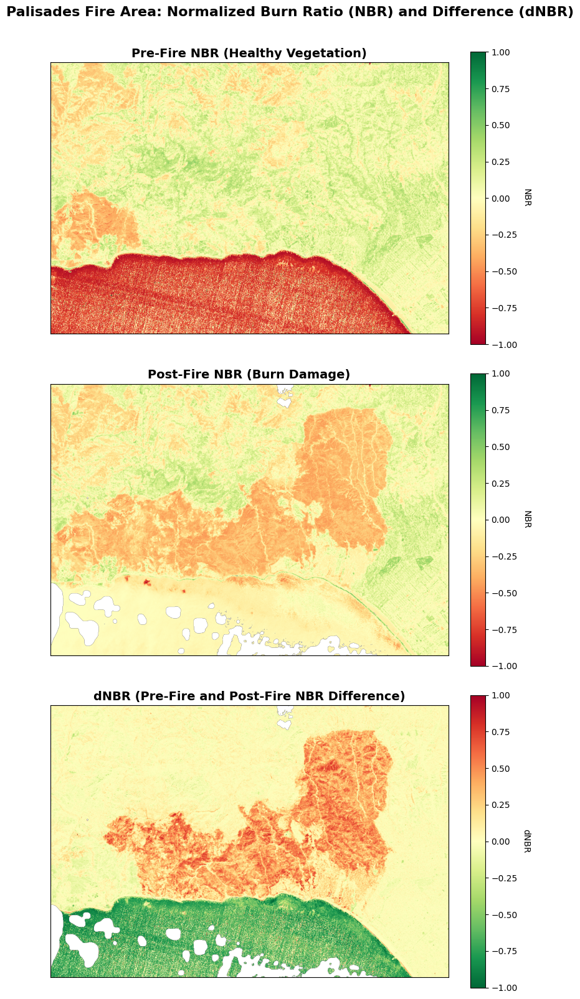

In [39]:
# Plot pre-fire NBR, post-fire NBR, and dNBR.
fig, axes = plt.subplots(3, 1, figsize=(8, 16))

# Pre-fire NBR.
pre_fire_plot = axes[0].imshow(nbr_pre.values, cmap="RdYlGn", vmin=-1, vmax=1)
axes[0].set_title("Pre-Fire NBR (Healthy Vegetation)", fontsize=14, fontweight="bold")
axes[0].xaxis.set_visible(False)
axes[0].yaxis.set_visible(False)
cbar0 = plt.colorbar(pre_fire_plot, ax=axes[0], fraction=0.05)
cbar0.set_label("NBR", rotation=270, labelpad=15)

# Post-fire NBR.
post_fire_plot = axes[1].imshow(nbr_post.values, cmap="RdYlGn", vmin=-1, vmax=1)
axes[1].set_title("Post-Fire NBR (Burn Damage)", fontsize=14, fontweight="bold")
axes[1].xaxis.set_visible(False)
axes[1].yaxis.set_visible(False)
cbar1 = plt.colorbar(post_fire_plot, ax=axes[1], fraction=0.05)
cbar1.set_label("NBR", rotation=270, labelpad=15)

# dNBR.
dnbr_plot = axes[2].imshow(dnbr.values, cmap="RdYlGn_r", vmin=-1, vmax=1)
axes[2].set_title(
    "dNBR (Pre-Fire and Post-Fire NBR Difference)", fontsize=14, fontweight="bold"
)
axes[2].xaxis.set_visible(False)
axes[2].yaxis.set_visible(False)
cbar2 = plt.colorbar(dnbr_plot, ax=axes[2], fraction=0.05)
cbar2.set_label("dNBR", rotation=270, labelpad=15)

plt.suptitle(
    "Palisades Fire Area: Normalized Burn Ratio (NBR) and Difference (dNBR)",
    fontsize=16,
    fontweight="bold",
    y=1,
)
plt.tight_layout()
plt.savefig(
    "final_project_files/images/dnbr_comparison.png", dpi=300, bbox_inches="tight"
)
plt.show()

In [40]:
# GET SPATIAL REFERENCE INFORMATION FROM SENTINEL DATA
# Metadata will be used to align all following datasets.
sentinel_crs = post_fire_data.rio.crs
sentinel_bounds = post_fire_data.rio.bounds()
sentinel_shape = (post_fire_data.sizes["y"], post_fire_data.sizes["x"])
sentinel_transform = post_fire_data.rio.transform()

print(f"CRS: {sentinel_crs}")
print(f"Bounds: {sentinel_bounds}")
print(f"Shape (rows, cols): {sentinel_shape}")
print(f"Transform:\n{sentinel_transform}")

CRS: EPSG:32611
Bounds: (341340.0, 3762940.0, 364800.0, 3778960.0)
Shape (rows, cols): (801, 1173)
Transform:
| 20.00, 0.00, 341340.00|
| 0.00,-20.00, 3778960.00|
| 0.00, 0.00, 1.00|


### Topographic Ancillary Data

The USGS 3DEP 10m Digital Elevation Model is processed to derive the Aspect array. Aspect indicates the compass direction that a slope faces, which is critical for addressing the topographic shadow failure mode. North-facing slopes in January receive less direct sunlight and appear darker in optical imagery, potentially causing false-positive burn classifications.

In [41]:
# QUERY USGS 3DEP DEM VIA STAC API
# The 3DEP 1m and 10m DEMs are available through Planetary Computer.
dem_catalog_url = "https://planetarycomputer.microsoft.com/api/stac/v1"
dem_catalog = Client.open(dem_catalog_url, modifier=planetary_computer.sign_inplace)

# SEARCH FOR 10M DEM TILES
dem_search = dem_catalog.search(collections=["3dep-seamless"], bbox=palisades_bbox)

dem_items = list(dem_search.item_collection())

print(f"DEM Tiles: {len(dem_items)}")

DEM Tiles: 4


In [42]:
dem_items[0]

<Item id=n35w119-13>

In [43]:
Image(url=dem_items[0].assets["rendered_preview"].href)

In [44]:
# LOAD DEM AND REPROJECT TO MATCH SENTINEL
dem_data = odc.stac.load(
    dem_items,
    bands=["data"],
    bbox=palisades_bbox,
    resolution=target_resolution,
    crs=target_crs,
    chunks={"x": 512, "y": 512},
)

# GET ELEVATION ARRAY
elevation = dem_data["data"].squeeze()

print(
    f"Elevation Range: [{float(elevation.min()):.1f}m, {float(elevation.max()):.1f}m]"
)
print(f"DEM Shape: {elevation.shape}")

Elevation Range: [-0.4m, 852.3m]
DEM Shape: (2, 801, 1173)


Sentinel-2 data is a 2D spatial grid (Y, X). DEM is a 3D array (Item, Y, X).

The Palisades bounding box crossed USGS tile boundary so STAC API returned two 3DEP tiles. If odc.stac.load ingests them, it stacks them along a time-item dimension and the .squeeze() function only removes dimensions with a length of 1, but because there are 2 tiles the dimension would remain.

If a 3D DEM array is fed into a numpy.dstack alongside 2D arrays the tensor construction will fail. So the two tiles must be composited into a single flat layer before stacking.

In [45]:
# SUPRESS WARNINGS
warnings.filterwarnings("ignore", category=NotGeoreferencedWarning)

# MOSAIC OVERLAPPING ELEVATION TILES
# Reduce time dimension to flatten 3D array into 2D spatial grid.
elevation_raw = dem_data["data"].max(dim="time").squeeze()

# ASSIGN CRS TO RAW DEM
# rioxarray requires source array to have CRS before reprojecting.
elevation_raw = elevation_raw.rio.write_crs(target_crs)

# SQUEEZE TIME DIMENSION FROM SENTINEL ARRAYS
# Remove single-length time dimension from datasets.
# Forces Sentinel data to 2D spatial grid.
post_fire_spatial = post_fire_data.squeeze()

# REPROJECT DEM TO SENTINEL GRID
# Match post_fire_spatial target.
elevation_aligned = elevation_raw.rio.reproject_match(post_fire_spatial)

# Must be identical.
print("Sentinel Shape:", post_fire_spatial.sizes)
print("DEM Shape:", elevation_aligned.sizes)

/usr/local/lib/python3.12/dist-packages/dask/array/reductions.py:325: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)


Sentinel Shape: Frozen({'y': 801, 'x': 1173})
DEM Shape: Frozen({'y': 801, 'x': 1173})


In [46]:
# ASPECT FROM DEM
# Aspect computed using gradient in x and y directions.
# Result in degrees where 0 = North, 90 = East, 180 = South, and 270 = West.
def calculate_aspect(dem, cell_size):
    # Convert to numpy for gradient calculation.
    dem_array = dem.values

    # Calculate gradients using numpy gradient function.
    # Gradient returns rate of change in y direction first, then x.
    dy, dx = np.gradient(dem_array, cell_size)

    # Calculate aspect in radians, then convert to degrees.
    aspect_rad = np.arctan2(-dy, dx)
    aspect_deg = np.degrees(aspect_rad)

    # Convert from mathematical convention to compass.
    # Rotate 90 degrees and handle negative values.
    aspect_compass = (90.0 - aspect_deg) % 360.0

    return aspect_compass


# ASPECT ARRAY
# Pass spatially aligned DEM array into calculation.
aspect_array = calculate_aspect(elevation_aligned, target_resolution)

print(
    f"Aspect Range: [{np.nanmin(aspect_array):.1f}, {np.nanmax(aspect_array):.1f}] degrees"
)
print(f"Aspect Shape: {aspect_array.shape}")

Aspect Range: [0.0, 360.0] degrees
Aspect Shape: (801, 1173)


In [47]:
# NORMALIZE ASPECT FOR MODEL
# Convert aspect to sine and cosine to handle circular characteristics.
# Can also normalize to 0-1 range for direct input as alternative.
aspect_normalized = aspect_array / 360.0

print(
    f"Normalized Aspect Range: [{np.nanmin(aspect_normalized):.3f}, {np.nanmax(aspect_normalized):.3f}]"
)

Normalized Aspect Range: [0.000, 1.000]


### Vector Data Ingestion

Three vector datasets are required:
1. **NIFC Fire Perimeter**: Defines the Region of Interest (ROI) for analysis.
2. **LA County Building Footprints**: Provides WUI infrastructure context.
3. **CAL FIRE DINS Points**: Identifies structures classified as "destroyed" during damage inspection.

In [48]:
# LOAD NIFC PALISADES FIRE PERIMETER
# Source: LA County Open Data Portal.
# Defines the official fire containment boundary.

fire_perimeter_path = "final_project_files/data/NIFC_FIRIS_Palisades_Perimeter.geojson"

fire_perimeter_gdf = gpd.read_file(fire_perimeter_path)

print(fire_perimeter_gdf.columns)
print(f"Original CRS: {fire_perimeter_gdf.crs}")

Index(['OBJECTID', 'type', 'Shape__Area', 'Shape__Length', 'Acres',
       'geometry'],
      dtype='object')
Original CRS: EPSG:4326


In [49]:
fire_perimeter_gdf

,OBJECTID,type,Shape__Area,Shape__Length,Acres,geometry
0,1,Heat Perimeter,1.182082e+03,267.101144,None,"POLYGON ((-118.51962 34.03061, -118.51962 34.0..."
1,2,Heat Perimeter,2.222488e+03,185.498783,None,"POLYGON ((-118.51944 34.03176, -118.51944 34.0..."
2,3,Heat Perimeter,2.101172e+01,22.412814,None,"POLYGON ((-118.52011 34.03244, -118.52011 34.0..."
3,4,Heat Perimeter,2.149922e+02,76.639180,None,"POLYGON ((-118.52061 34.03235, -118.52063 34.0..."
4,5,Heat Perimeter,4.420345e+04,1569.259764,None,"POLYGON ((-118.5256 34.03302, -118.5256 34.033..."
5,6,Heat Perimeter,3.734375e+01,25.061294,None,"POLYGON ((-118.52286 34.03427, -118.52283 34.0..."
6,7,Heat Perimeter,1.183555e+02,46.890360,None,"POLYGON ((-118.52276 34.03435, -118.52273 34.0..."
7,8,Heat Perimeter,1.686719e+01,16.860287,None,"POLYGON ((-118.51818 34.03739, -118.5182 34.03..."
8,9,Heat Perimeter,1.766301e+03,264.850402,None,"POLYGON ((-118.53964 34.03715, -118.53971 34.0..."
9,10,Heat Perimeter,7.939795e+04,2620.515743,None,"POLYGON ((-118.51748 34.03607, -118.51752 34.0..."


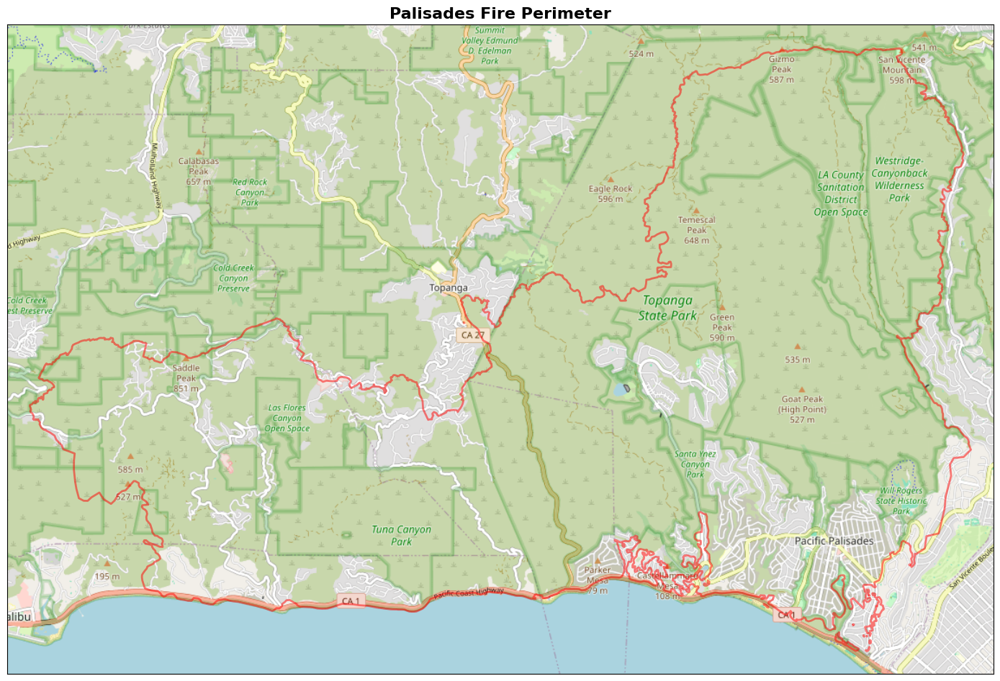

In [50]:
# Plot fire perimeter with background tile.
fig, ax = plt.subplots(figsize=(14, 12))

# Reproject to Web Mercator (EPSG:3857) for tiles.
fire_perimeter_web = fire_perimeter_gdf.to_crs(epsg=3857)

# Get bounds and set axis limits.
bounds = fire_perimeter_web.total_bounds
ax.set_xlim(bounds[0] - 500, bounds[2] + 500)
ax.set_ylim(bounds[1] - 500, bounds[3] + 500)

# Add background tile.
ctx.add_basemap(
    ax,
    crs=fire_perimeter_web.crs,
    source=ctx.providers.OpenStreetMap.Mapnik,
    zoom=13,
    attribution=False,
)

# Plot fire perimeter on top.
fire_perimeter_web.plot(
    ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2
)

# Remove axis ticks.
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

ax.set_title("Palisades Fire Perimeter", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig(
    "final_project_files/images/palisades_fire_perimeter.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

In [51]:
# LOAD LOS ANGELES COUNTY BUILDING FOOTPRINTS
# Source: Microsoft.
# Filter to study area extent to reduce data volume.
buildings_path = (
    "final_project_files/data/Microsoft_California_Building_Footprints_Filtered.geojson"
)

# Create bounding box geometry, expects tuple, not list.
bbox_geometry = box(
    palisades_bbox[0], palisades_bbox[1], palisades_bbox[2], palisades_bbox[3]
)

buildings_gdf = gpd.read_file(buildings_path, bbox=bbox_geometry, engine="pyogrio")

print(buildings_gdf.columns)
print(f"Original CRS: {buildings_gdf.crs}")

Index(['release', 'capture_dates_range', 'geometry'], dtype='object')
Original CRS: EPSG:4326


In [52]:
# Spatial join to find buildings that intersect with fire perimeter.
buildings_web = buildings_gdf.to_crs(epsg=3857)
buildings_filtered = gpd.sjoin(
    buildings_web, fire_perimeter_web, how="inner", predicate="intersects"
).drop(columns=["index_right"])

print(f"Original Buildings: {len(buildings_web)}")
print(f"Buildings Intersecting Fire Perimeter: {len(buildings_filtered)}")

Original Buildings: 45527
Buildings Intersecting Fire Perimeter: 9344


In [53]:
buildings_filtered

,release,capture_dates_range,geometry,OBJECTID,type,Shape__Area,Shape__Length,Acres
552,2,5/9/2018-3/13/2019,"POLYGON ((-13191697.625 4037053.963, -13191705...",24,Heat Perimeter,1.420688e+08,105530.363538,None
563,2,5/9/2018-3/13/2019,"POLYGON ((-13191801.709 4037153.534, -13191794...",24,Heat Perimeter,1.420688e+08,105530.363538,None
564,2,5/9/2018-3/13/2019,"POLYGON ((-13191808.944 4037083.794, -13191801...",24,Heat Perimeter,1.420688e+08,105530.363538,None
569,2,5/9/2018-3/13/2019,"POLYGON ((-13191857.48 4036156.119, -13191865....",24,Heat Perimeter,1.420688e+08,105530.363538,None
610,2,5/9/2018-3/13/2019,"POLYGON ((-13191967.129 4035930.258, -13191992...",24,Heat Perimeter,1.420688e+08,105530.363538,None
...,...,...,...,...,...,...,...,...
45439,2,4/22/2018-6/1/2018,"POLYGON ((-13208281.891 4033921.626, -13208287...",24,Heat Perimeter,1.420688e+08,105530.363538,None
45443,2,4/22/2018-6/1/2018,"POLYGON ((-13208569.541 4035194.126, -13208551...",24,Heat Perimeter,1.420688e+08,105530.363538,None
45450,2,4/22/2018-6/1/2018,"POLYGON ((-13208934.558 4034808.814, -13208921...",24,Heat Perimeter,1.420688e+08,105530.363538,None
45451,2,4/22/2018-6/1/2018,"POLYGON ((-13208965.727 4034098.816, -13208964...",24,Heat Perimeter,1.420688e+08,105530.363538,None


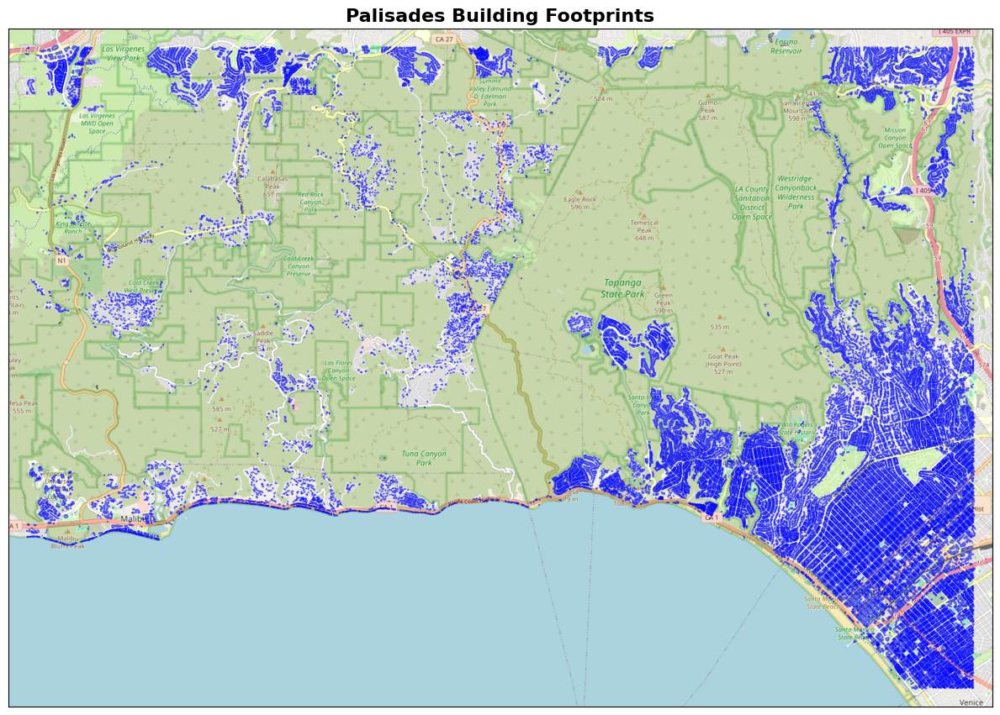

In [54]:
# Plot building footprints with background tile.
fig, ax = plt.subplots(figsize=(12, 12))

# Reproject to Web Mercator (EPSG:3857) for tiles.
buildings_web = buildings_gdf.to_crs(epsg=3857)

# Get bounds and set axis limits.
bounds = buildings_web.total_bounds
ax.set_xlim(bounds[0] - 500, bounds[2] + 500)
ax.set_ylim(bounds[1] - 500, bounds[3] + 500)

# Add background tile.
ctx.add_basemap(
    ax,
    crs=buildings_web.crs,
    source=ctx.providers.OpenStreetMap.Mapnik,
    zoom=13,
    attribution=False,
)

# Plot building footprints on top.
buildings_web.plot(ax=ax, alpha=0.5, edgecolor="blue")

# Remove axis ticks.
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

ax.set_title("Palisades Building Footprints", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig(
    "final_project_files/images/palisades_building_footprints.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

In [55]:
# LOAD CAL FIRE DAMAGE INSPECTION (DINS) POINTS
# Source: California Natural Resources Agency Open Data.
dins_path = "final_project_files/data/CAL_FIRE_DINS_Palisades.geojson"

dins_gdf = gpd.read_file(dins_path, bbox_geometry)

print(dins_gdf.columns)
print(f"Original CRS: {dins_gdf.crs}")

Index(['OBJECTID', 'GLOBALID', 'DAMAGE', 'STRUCTURETYPE', 'STREETNUMBER',
       'STREETNAME', 'STREETTYPE', 'STREETSUFFIX', 'CITY', 'STATE', 'ZIPCODE',
       'CALFIREUNIT', 'COUNTY', 'COMMUNITY', 'BATTALION', 'INCIDENTNAME',
       'INCIDENTNUM', 'INCIDENTSTARTDATE', 'HAZARDTYPE',
       'WHEREFIRESTARTEDONSTRUCTURE', 'WHATDIDFIRESTARTFROM',
       'DEFENSIVEACTIONS', 'STRUCTURECATEGORY', 'NUMBEROFUNITPERSTRUCTURE',
       'NOOUTBUILDINGSDAMAGED', 'NOOUTBUILDINGSNOTDAMAGED',
       'NOOFCARSONPROPERTY', 'ROOFCONSTRUCTION', 'EAVES', 'VENTSCREEN',
       'EXTERIORSIDING', 'WINDOWPANE', 'DECKPORCHONGRADE', 'DECKPORCHELEVATED',
       'PATIOCOVERCARPORT', 'FENCEATTACHEDTOSTRUCTURE', 'PROPANETANKDISTANCE',
       'UTILITYMISCSTRUCTUREDISTANCE', 'FIRENAME', 'APN',
       'ASSESSEDIMPROVEDVALUE', 'YEARBUILT', 'SITEADDRESS', 'LATITUDE',
       'LONGITUDE', 'geometry'],
      dtype='object')
Original CRS: EPSG:4326


In [56]:
dins_gdf

,OBJECTID,GLOBALID,DAMAGE,STRUCTURETYPE,STREETNUMBER,STREETNAME,STREETTYPE,STREETSUFFIX,CITY,STATE,...,PROPANETANKDISTANCE,UTILITYMISCSTRUCTUREDISTANCE,FIRENAME,APN,ASSESSEDIMPROVEDVALUE,YEARBUILT,SITEADDRESS,LATITUDE,LONGITUDE,geometry
0,294571,2afa926d-bea4-4638-8c1e-077f4cbe6f2b,Destroyed (>50%),Utility Misc Structure,20527,Big Rock,Drive,Blding B,Malibu,CA,...,N/A,<30',None,4449013014,884565,1960,"20527 BIG ROCK DR, MALIBU, CA 90265",34.042652,-118.618492,POINT (-118.61849 34.04265)
1,294572,4e9d15a0-6c99-4fb8-a87b-04fa57d07af5,Destroyed (>50%),Single Family Residence Multi Story,576,Radcliffe,Avenue,Blding A,Pacific Palisades,CA,...,None,None,None,4412016013,75146,1953,"576 RADCLIFFE AVE, PACIFIC PALISADES, CA 90272",34.040286,-118.530571,POINT (-118.53057 34.04029)
2,294573,8b9fae66-2c5a-42a4-9ee2-b86c80e9b371,Destroyed (>50%),Single Family Residence Multi Story,20781,Big Rock,Drive,Blding A,Malibu,CA,...,N/A,<30',None,4449015018,471301,1957,"20781 BIG ROCK DR, MALIBU, CA 90265",34.043973,-118.621211,POINT (-118.62121 34.04397)
3,294574,5fcacc3a-8d27-47e4-9bea-2003aff70686,Affected (>0-10%),Single Family Residence Single Story,21500,Calle Del Barco,None,Blding B,Malibu,CA,...,None,None,None,4451011068,3153535,1989,"21500 CALLE DEL BARCO, MALIBU, CA 90265",34.041053,-118.643934,POINT (-118.64393 34.04105)
4,294575,5771693f-c8ef-4fb9-8104-99c8f9940331,Destroyed (>50%),Single Family Residence Single Story,22108,Pacific Coast,Highway,Blding A,Malibu,CA,...,N/A,NA,None,4451006035,111550,2002,"22108 PACIFIC COAST HWY, MALIBU, CA 90265",34.038732,-118.656064,POINT (-118.65606 34.03873)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12132,306619,5434deb3-a2c8-4ff8-8af8-962c36ab35ba,No Damage,Utility Misc Structure,507,Arbramar,Avenue,Blding B,Pacific Palisades,CA,...,N/A,None,None,4413006003,470581,1949,"507 ARBRAMAR AVE, PACIFIC PALISADES, CA 90272",34.042527,-118.536293,POINT (-118.53629 34.04253)
12133,306620,0e10e3b7-4952-4381-9551-56925226007e,Destroyed (>50%),Single Family Residence Single Story,557,Tahquitz,Place,Blding A,Pacific Palisades,CA,...,None,None,None,4414004004,284485,1946,"557 TAHQUITZ PL, PACIFIC PALISADES, CA 90272",34.044118,-118.538202,POINT (-118.5382 34.04412)
12134,306621,23b77272-d146-48a3-b751-90346ccac3aa,Destroyed (>50%),Single Family Residence Multi Story,15866,Seabec,Circle,None,Pacific Palisades,CA,...,None,None,None,4413020020,1629326,2009,"15866 SEABEC CIR, PACIFIC PALISADES, CA 90272",34.040603,-118.534836,POINT (-118.53484 34.0406)
12135,306622,1c40d4e4-b3e3-4dd1-9ff9-920bf4d86593,Destroyed (>50%),Utility Misc Structure,922,Hartzell,Street,Blding B,Pacific Palisades,CA,...,None,None,None,4423021006,216896,1923,"922 HARTZELL ST, PACIFIC PALISADES, CA 90272",34.046440,-118.519450,POINT (-118.51945 34.04644)


In [57]:
dins_gdf["DAMAGE"].unique()

array(['Destroyed (>50%)', 'Affected (>0-10%)', 'No Damage',
       'Major (25-50%)', 'Minor (10-25%)', 'Inaccessible'], dtype=object)

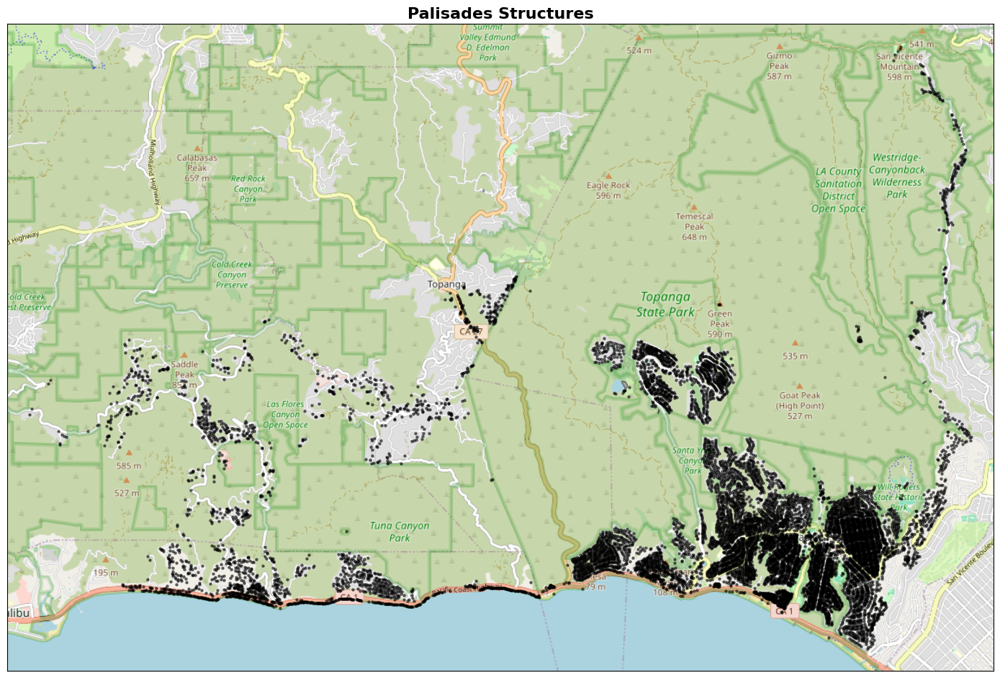

In [58]:
# Plot DINS with background tile.
fig, ax = plt.subplots(figsize=(14, 12))

# Reproject to Web Mercator (EPSG:3857) for tiles.
dins_web = dins_gdf.to_crs(epsg=3857)

# Get bounds and set axis limits.
bounds = dins_web.total_bounds
ax.set_xlim(bounds[0] - 500, bounds[2] + 500)
ax.set_ylim(bounds[1] - 500, bounds[3] + 500)

# Add background tile.
ctx.add_basemap(
    ax,
    crs=dins_web.crs,
    source=ctx.providers.OpenStreetMap.Mapnik,
    zoom=13,
    attribution=False,
)

# Plot DINS on top.
dins_web.plot(ax=ax, alpha=0.5, color="black", markersize=5)

# Remove axis ticks.
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

ax.set_title("Palisades Structures", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig(
    "final_project_files/images/palisades_og_structures.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

In [59]:
# FILTER TO DAMAGED STRUCTURES
# Include all structures with any level of damage: Destroyed, Major, Minor, Affected, and Inaccessible.
# Assume that Inaccessible is potentially damaged.
damage_categories = [
    "Destroyed (>50%)",
    "Major (25-50%)",
    "Minor (10-25%)",
    "Affected (>0-10%)",
    "Inaccessible",
]

if "DAMAGE" in dins_gdf.columns:
    dins_damaged = dins_gdf[dins_gdf["DAMAGE"].isin(damage_categories)].copy()
else:
    # Assume all points are affected if no damage field exists.
    dins_damaged = dins_gdf.copy()

print(f"Damaged Structures in Study Area: {len(dins_damaged)}")
print(f"Original Structures in Study Area: {len(dins_gdf)}")
print(f"% Damaged Structures: {len(dins_damaged) / len(dins_gdf) * 100:.1f}%\n")

# Breakdown by damage category.
if len(dins_damaged) > 0 and "DAMAGE" in dins_damaged.columns:
    print(dins_damaged["DAMAGE"].value_counts())

Damaged Structures in Study Area: 7876
Original Structures in Study Area: 12137
% Damaged Structures: 64.9%

DAMAGE
Destroyed (>50%)     6845
Affected (>0-10%)     732
Minor (10-25%)        171
Major (25-50%)         72
Inaccessible           56
Name: count, dtype: int64


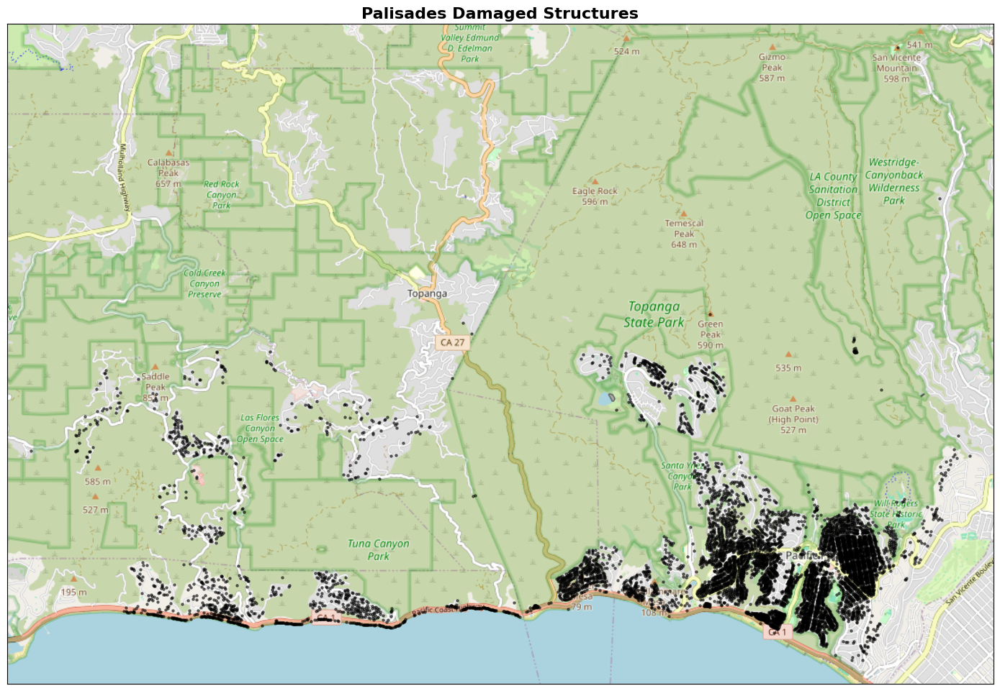

In [60]:
# Plot DINS with background tile.
fig, ax = plt.subplots(figsize=(14, 12))

# Reproject to Web Mercator (EPSG:3857) for tiles.
dins_damaged_web = dins_damaged.to_crs(epsg=3857)

# Get bounds and set axis limits.
bounds = dins_damaged_web.total_bounds
ax.set_xlim(bounds[0] - 500, bounds[2] + 500)
ax.set_ylim(bounds[1] - 500, bounds[3] + 500)

# Add background tile.
ctx.add_basemap(
    ax,
    crs=dins_damaged_web.crs,
    source=ctx.providers.OpenStreetMap.Mapnik,
    zoom=13,
    attribution=False,
)

# Plot DINS on top.
dins_damaged_web.plot(ax=ax, alpha=0.5, color="black", markersize=5)

# Remove axis ticks.
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

ax.set_title("Palisades Damaged Structures", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig(
    "final_project_files/images/palisades_damaged_structures.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

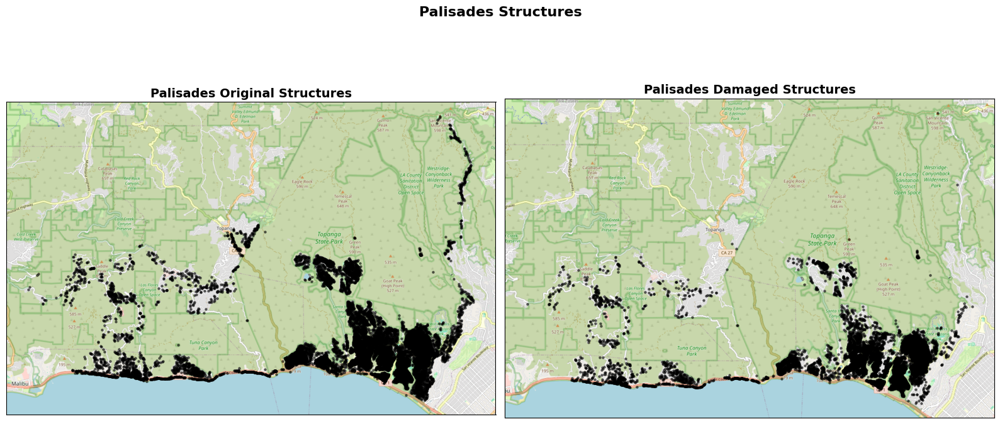

In [61]:
# Plot before and after building damaged buildings.
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Before filter.
dins_web.plot(ax=axes[0], alpha=0.5, color="black", markersize=5)
axes[0].set_title("Palisades Original Structures", fontsize=14, fontweight="bold")
axes[0].xaxis.set_visible(False)
axes[0].yaxis.set_visible(False)

# After filter.
dins_damaged_web.plot(ax=axes[1], alpha=0.5, color="black", markersize=5)
axes[1].set_title("Palisades Damaged Structures", fontsize=14, fontweight="bold")
axes[1].xaxis.set_visible(False)
axes[1].yaxis.set_visible(False)

# Add background tiles.
ctx.add_basemap(
    axes[0],
    crs=dins_damaged_web.crs,
    source=ctx.providers.OpenStreetMap.Mapnik,
    zoom=13,
    attribution=False,
)
ctx.add_basemap(
    axes[1],
    crs=dins_damaged_web.crs,
    source=ctx.providers.OpenStreetMap.Mapnik,
    zoom=13,
    attribution=False,
)

plt.suptitle("Palisades Structures", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig(
    "final_project_files/images/palisades_structures_filtered.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

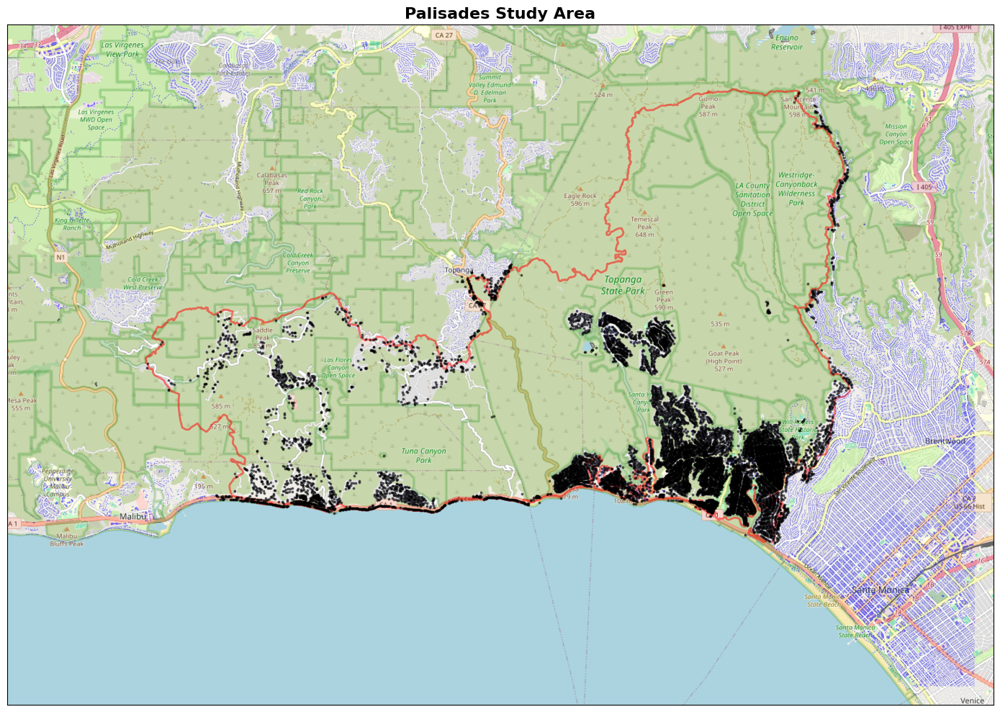

In [62]:
# Plot all with background tile.
fig, ax = plt.subplots(figsize=(14, 12))

# Get bounds and set axis limits.
bounds = buildings_web.total_bounds
ax.set_xlim(bounds[0] - 500, bounds[2] + 500)
ax.set_ylim(bounds[1] - 500, bounds[3] + 500)

# Add background tile.
ctx.add_basemap(
    ax,
    crs=buildings_web.crs,
    source=ctx.providers.OpenStreetMap.Mapnik,
    zoom=13,
    attribution=False,
)

# Plot building footprints on top.
fire_perimeter_web.plot(
    ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2
)
buildings_web.plot(ax=ax, alpha=0.5, color="blue")
dins_web.plot(ax=ax, alpha=0.5, color="black", markersize=3)

# Remove axis ticks.
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

ax.set_title("Palisades Study Area", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig(
    "final_project_files/images/palisades_study_area.png", dpi=300, bbox_inches="tight"
)
plt.show()

### Spatial Alignment

All vector datasets must be reprojected to match the exact Coordinate Reference System (CRS) of the Sentinel-2 optical grid. This ensures precise overlay for rasterization and tensor stacking.

In [63]:
# REPROJECT ALL VECTOR DATA TO TARGET CRS
# Target CRS matches Sentinel-2 data projection (UTM Zone 11N).
fire_perimeter_proj = fire_perimeter_gdf.to_crs(target_crs)
buildings_proj = buildings_gdf.to_crs(target_crs)
dins_proj = dins_damaged.to_crs(target_crs)

print(f"Fire Perimeter CRS: {fire_perimeter_proj.crs}")
print(f"Buildings CRS: {buildings_proj.crs}")
print(f"DINS CRS: {dins_proj.crs}")

Fire Perimeter CRS: EPSG:32611
Buildings CRS: EPSG:32611
DINS CRS: EPSG:32611


In [64]:
# CLIP VECTOR DATA TO STUDY AREA EXTENT
# Create bounding box in target CRS for clipping.
# Transform bbox coordinates to target CRS.
transformer = Transformer.from_crs("EPSG:4326", target_crs, always_xy=True)
bbox_min_x, bbox_min_y = transformer.transform(palisades_bbox[0], palisades_bbox[1])
bbox_max_x, bbox_max_y = transformer.transform(palisades_bbox[2], palisades_bbox[3])
bbox_proj = box(bbox_min_x, bbox_min_y, bbox_max_x, bbox_max_y)

# CLIP FIRE PERIMETER TO STUDY AREA
fire_perimeter_clipped = fire_perimeter_proj.clip(bbox_proj)

### Rasterization

Convert vector geometries to raster arrays matching the Sentinel-2 grid. This includes:
1. Fire perimeter to create the Area of Interest (AOI) mask.
2. Building footprints for the WUI infrastructure channel.
3. Destroyed structure locations for target mask generation.

In [65]:
# DEFINE RASTERIZATION PARAMETERS
# Use Sentinel-2 grid as reference for all rasterization.
raster_transform = from_bounds(
    sentinel_bounds[0],
    sentinel_bounds[1],
    sentinel_bounds[2],
    sentinel_bounds[3],
    sentinel_shape[1],
    sentinel_shape[0],
)

print(f"Output Shape: {sentinel_shape}")
print(f"Transform:\n{raster_transform}")

Output Shape: (801, 1173)
Transform:
| 20.00, 0.00, 341340.00|
| 0.00,-20.00, 3778960.00|
| 0.00, 0.00, 1.00|


In [66]:
# RASTERIZE FIRE PERIMETER TO CREATE ROI MASK
# Pixels inside fire perimeter are set to 1, outside to 0.
def rasterize_geometries(geometries, shape, transform, fill_value=0, default_value=1):
    """Rasterize vector geometries to a numpy array."""
    if len(geometries) == 0:
        return np.zeros(shape, dtype=np.uint8)

    # Create geometry-value pairs for rasterization.
    shapes = [(geom, default_value) for geom in geometries]

    # Rasterize.
    raster = features.rasterize(
        shapes=shapes,
        out_shape=shape,
        transform=transform,
        fill=fill_value,
        dtype=np.uint8,
    )

    return raster


# RASTERIZE FIRE PERIMETER
aoi_mask = rasterize_geometries(
    fire_perimeter_clipped.geometry, sentinel_shape, raster_transform
)

print(f"AOI Mask Shape: {aoi_mask.shape}")
print(f"Pixels Inside Fire Perimeter: {np.sum(aoi_mask == 1)}")

AOI Mask Shape: (801, 1173)
Pixels Inside Fire Perimeter: 243261


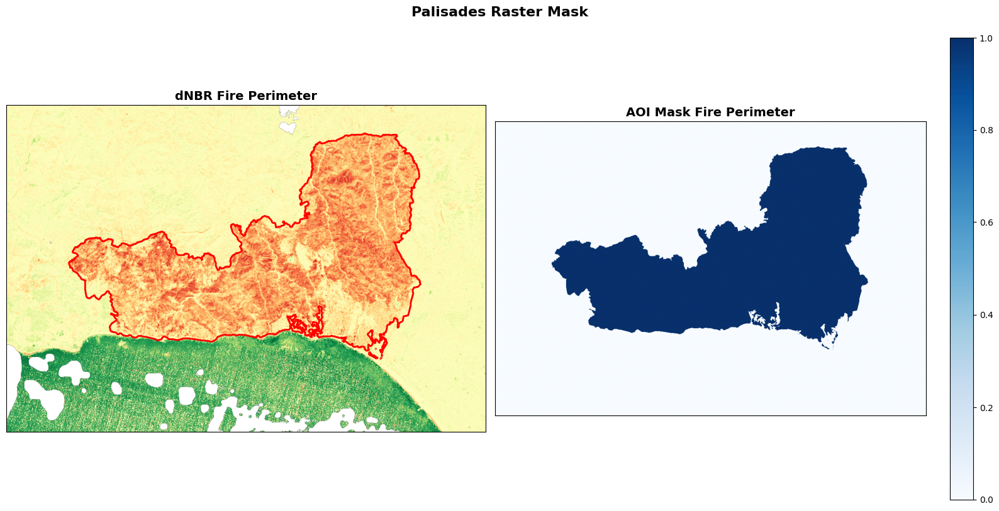

In [67]:
# Plot AOI mask on dNBR.
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# dNBR with ROI outline.
axes[0].imshow(dnbr, cmap="RdYlGn_r", vmin=-1, vmax=1.0)
axes[0].contour(aoi_mask, levels=[0.5], colors="red", linewidths=2)
axes[0].set_title("dNBR Fire Perimeter", fontsize=14, fontweight="bold")
axes[0].xaxis.set_visible(False)
axes[0].yaxis.set_visible(False)

# AOI mask only.
im = axes[1].imshow(aoi_mask, cmap="Blues")
axes[1].set_title("AOI Mask Fire Perimeter", fontsize=14, fontweight="bold")
axes[1].xaxis.set_visible(False)
axes[1].yaxis.set_visible(False)
plt.colorbar(im, ax=axes[1], fraction=0.05)

plt.suptitle("Palisades Raster Mask", fontsize=16, fontweight="bold", y=1)
plt.tight_layout()
plt.savefig(
    "final_project_files/images/palisades_raster_mask.png", dpi=300, bbox_inches="tight"
)
plt.show()

In [68]:
# BUFFER DINS POINTS FOR GPS DRIFT CORRECTION
# Apply 15-meter buffer to projected DINS points to account for field GPS error.
dins_buffered = dins_proj.copy()
dins_buffered.geometry = dins_buffered.geometry.buffer(15)

# Dissolve overlapping buffers to create unified damage zones.
# This prevents double-counting where multiple inspection points overlap.
dins_buffered_dissolved = dins_buffered.dissolve()

print(f"DINS Points Buffered: {len(dins_proj)}")
print(f"Dissolved Geometry Count: {len(dins_buffered_dissolved)}")

DINS Points Buffered: 7876
Dissolved Geometry Count: 1


Labels are constructed directly from buffered inspection points, NOT from building footprint geometries. This ensures the building footprint feature channel remains independent from the target labels, preventing target leakage.

In [69]:
# RASTERIZE ALL BUILDING FOOTPRINTS
# Convert complete infrastructure geometry into pixel grid.
# Baseline infrastructure channel for feature tensor.
building_raster = rasterize_geometries(
    buildings_proj.geometry, sentinel_shape, raster_transform
)

print(f"Building Raster Shape: {building_raster.shape}")
print(f"Pixels with Buildings: {np.sum(building_raster == 1)}")

Building Raster Shape: (801, 1173)
Pixels with Buildings: 34910


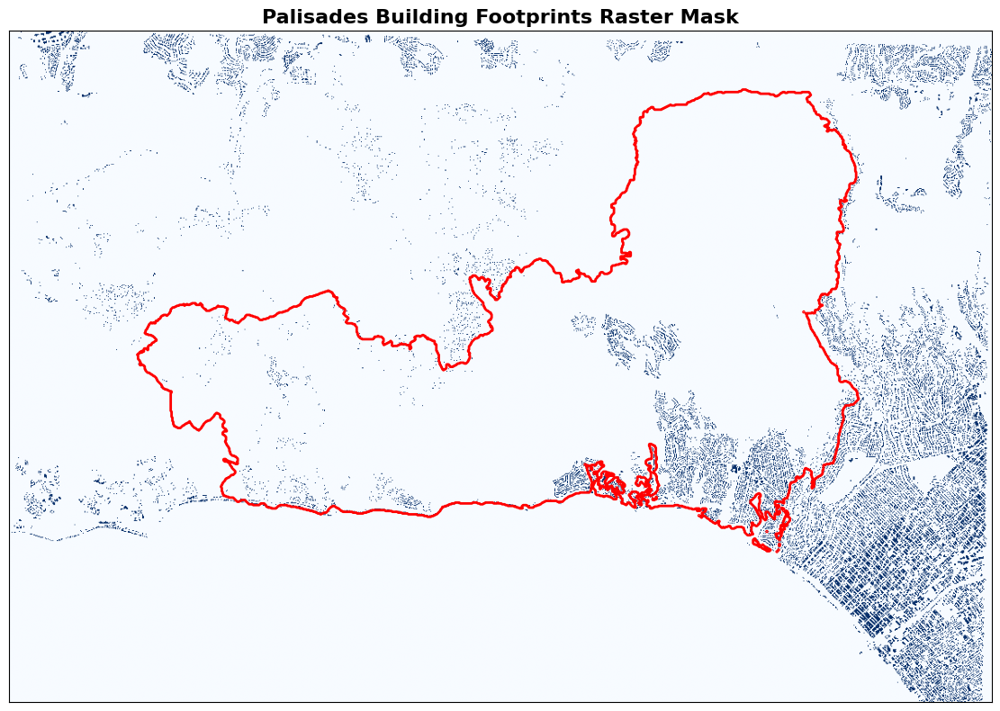

In [70]:
# Plot building footprints.
fig, ax = plt.subplots(figsize=(16, 8))

ax.imshow(building_raster, cmap="Blues")
ax.contour(aoi_mask, levels=[0.5], colors="red", linewidths=2)
ax.set_title(
    "Palisades Building Footprints Raster Mask", fontsize=16, fontweight="bold"
)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(
    "final_project_files/images/buildings_mask.png", dpi=300, bbox_inches="tight"
)
plt.show()

In [71]:
# RASTERIZE DINS DAMAGE ZONES
# Convert buffered DINS inspection points directly to raster grid.
damaged_raster = rasterize_geometries(
    dins_buffered_dissolved.geometry,
    sentinel_shape,
    raster_transform,
)

print(f"Damaged Raster Shape: {damaged_raster.shape}")
print(f"Pixels in DINS Damage Zones: {np.sum(damaged_raster == 1)}")

Damaged Raster Shape: (801, 1173)
Pixels in DINS Damage Zones: 10111


Labels are derived from field inspection locations, NOT from building footprint polygons. This decouples the target mask from the building footprint feature channel, enabling valid model evaluation.

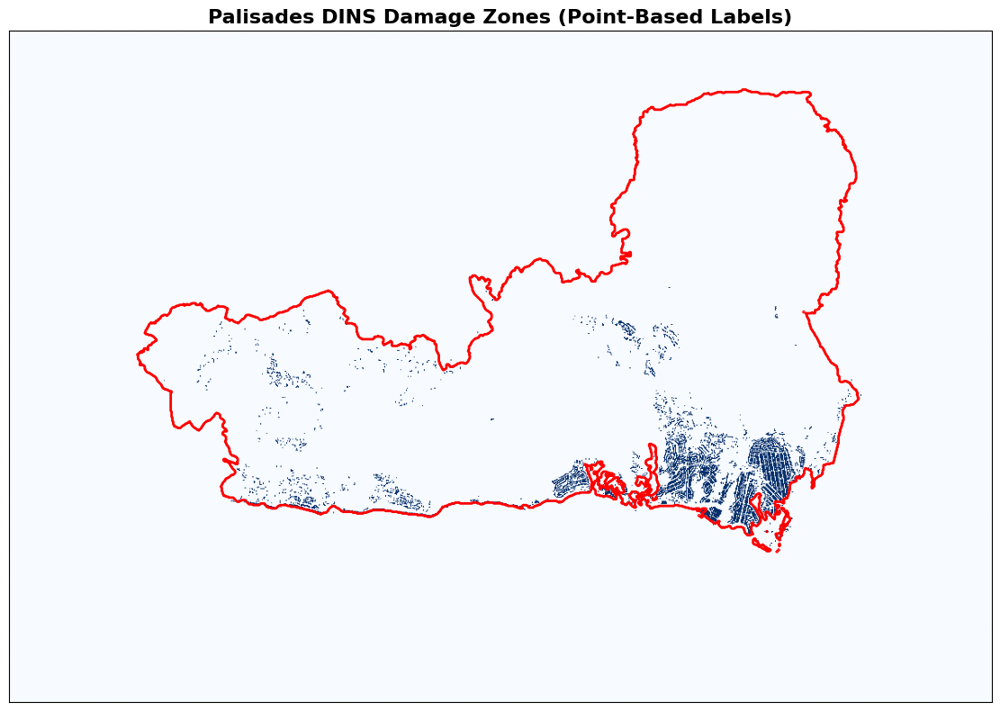

In [72]:
# Plot DINS-based damage zones.
fig, ax = plt.subplots(figsize=(16, 8))

ax.imshow(damaged_raster, cmap="Blues")
ax.contour(aoi_mask, levels=[0.5], colors="red", linewidths=2)
ax.set_title(
    "Palisades DINS Damage Zones (Point-Based Labels)", fontsize=16, fontweight="bold"
)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(
    "final_project_files/images/dins_damage_zones.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

In [73]:
# Create base map centered on study area.
center_lat = np.mean([palisades_bbox[1], palisades_bbox[3]])
center_lon = np.mean([palisades_bbox[0], palisades_bbox[2]])

map = folium.Map(
    location=[center_lat, center_lon], zoom_start=13, tiles="OpenStreetMap"
)

# Convert raster to RGB image.
damaged_rgb = np.stack(
    [
        (damaged_raster * 255).astype(np.uint8),  # Red.
        np.zeros_like(damaged_raster, dtype=np.uint8),  # Green.
        np.zeros_like(damaged_raster, dtype=np.uint8),  # Blue.
    ],
    axis=-1,
)

# Add raster as overlay with layer control.
img_bounds = [
    [palisades_bbox[1], palisades_bbox[0]],
    [palisades_bbox[3], palisades_bbox[2]],
]

folium.raster_layers.ImageOverlay(
    image=damaged_rgb, bounds=img_bounds, opacity=0.75, name="Damaged Buildings Raster"
).add_to(map)

# Create DINS points layer.
dins_feature_group = folium.FeatureGroup(name="DINS Damaged Points", show=True)
dins_4326 = dins_proj.to_crs(epsg=4326)

for idx, row in dins_4326.iterrows():
    geom = row.geometry
    # Get coordinates.
    if geom.geom_type == "Point":
        lat, lon = geom.y, geom.x
    else:
        lat, lon = geom.centroid.y, geom.centroid.x

    # Create popup with damage info.
    popup_text = f"DINS Point {idx}"
    if "DAMAGE" in row.index:
        popup_text += f"<br>Damage: {row['DAMAGE']}"

    folium.CircleMarker(
        location=[lat, lon],
        radius=3,
        popup=folium.Popup(popup_text, max_width=200),
        tooltip=f"Point {idx}",
        color="blue",
        fill=True,
        fillColor="cyan",
        fillOpacity=0.8,
        weight=2,
    ).add_to(dins_feature_group)

dins_feature_group.add_to(map)

# Create fire perimeter layer.
perimeter_feature_group = folium.FeatureGroup(name="Fire Perimeter", show=True)
fire_perimeter_4326 = fire_perimeter_gdf.to_crs(epsg=4326)

for geom in fire_perimeter_4326.geometry:
    coords = [(lat, lon) for lon, lat in geom.exterior.coords]
    folium.PolyLine(locations=coords, color="red", weight=3, opacity=0.75).add_to(
        perimeter_feature_group
    )

perimeter_feature_group.add_to(map)

# Add layer control to toggle on/off.
folium.LayerControl(position="topright", collapsed=False).add_to(map)

# Display.
map

Output hidden; open in https://colab.research.google.com to view.

### Leaking dNBR Target (Reference Only, Not Used for Modeling)

This section calculates a dNBR-derived target mask for documentation and comparison purposes only. This target is deliberately NOT used for model training or evaluation because it introduces target leakage: dNBR is an input feature (Channel 0 of the tensor), and using it to generate labels would allow the model to learn a trivial threshold rather than genuine predictive relationships.

The calculation below applies localized Otsu thresholding on dNBR within the AOI and combines it with the DINS structural damage mask via Boolean union. This leaking target is saved separately as `leaked_y_target.npy` for reference.

The actual modeling target (`y_target.npy`) uses ONLY the DINS field inspection labels, consistent with the methodological approach described in the proposal.

In [74]:
# GET DNBR VALUES WITHIN ROI ONLY
# Localized thresholding prevents unburned areas from biasing Otsu calculation.
dnbr_array = dnbr_masked.values

# APPLY AOI MASK TO DNBR
dnbr_roi = np.where(aoi_mask == 1, dnbr_array, np.nan)

# GET VALID PIXELS FOR OTSU CALCULATION
# Remove NaN values from calculation.
valid_dnbr_pixels = dnbr_roi[~np.isnan(dnbr_roi)]

print(f"Valid Pixels in AOI: {len(valid_dnbr_pixels)}")
print(
    f"dNBR Range in AOI: [{np.min(valid_dnbr_pixels):.3f}, {np.max(valid_dnbr_pixels):.3f}]"
)
print(f"dNBR Mean in AOI: {np.mean(valid_dnbr_pixels):.3f}")

Valid Pixels in AOI: 243247
dNBR Range in AOI: [-0.634, 0.968]
dNBR Mean in AOI: 0.345


In [75]:
# CALCULATE OTSU THRESHOLD ON LOCALIZED DNBR
# Otsu algorithm finds optimal threshold to separate burn from non-burn.
otsu_threshold = threshold_otsu(valid_dnbr_pixels)

print(f"Calculated Otsu Threshold: {otsu_threshold:.4f}")

Calculated Otsu Threshold: 0.3326


In [76]:
# GENERATE VEGETATION BURN MASK USING OTSU THRESHOLD
# Pixels above threshold within ROI are classified as burned vegetation.
vegetation_burn_mask = (dnbr_array > otsu_threshold) & (aoi_mask == 1)
vegetation_burn_mask = vegetation_burn_mask.astype(np.uint8)

print(f"Burned Vegetation Pixels: {np.sum(vegetation_burn_mask == 1)}")
print(
    f"Percentage of ROI: {np.sum(vegetation_burn_mask) / np.sum(aoi_mask) * 100:.1f}%"
)

Burned Vegetation Pixels: 131786
Percentage of ROI: 54.2%


In [77]:
# CREATE FINAL TARGET MASK USING BOOLEAN UNION
# A pixel is damaged if (dNBR > Otsu) OR (contains damaged structure).
leaked_y_target = np.logical_or(vegetation_burn_mask, damaged_raster).astype(np.uint8)

# APPLY ROI MASK TO FINAL TARGET
# Ensure only pixels within fire perimeter are considered.
leaked_y_target = leaked_y_target * aoi_mask

print(f"Leaking Target Shape: {leaked_y_target.shape}")
print(f"Leaking Target Damaged Pixels: {np.sum(leaked_y_target == 1)}")
print(f"Leaking Target Damaged % of ROI: {np.sum(leaked_y_target) / np.sum(aoi_mask) * 100:.1f}%")
print(
    f"Leaking Target Class Distribution: 0 (Unburned) = {np.sum(leaked_y_target == 0)}, 1 (Damaged) = {np.sum(leaked_y_target == 1)}"
)

Leaking Target Shape: (801, 1173)
Leaking Target Damaged Pixels: 140978
Leaking Target Damaged % of ROI: 58.0%
Leaking Target Class Distribution: 0 (Unburned) = 798595, 1 (Damaged) = 140978


In [78]:
# LABEL CONSTRUCTION SUMMARY
print("DINS LABEL CONSTRUCTION")
print(f"CAL FIRE Inspection Points: {len(dins_proj)}")
print("Buffer Radius Applied: 15 meters")
print(f"Total DINS Damage Zone Pixels: {np.sum(damaged_raster == 1)}")

print("\nFEATURE-LABEL INDEPENDENCE CHECK")
# Verify that damage labels are NOT perfectly correlated with building footprints.
# If labels were derived from footprint geometries, overlap would be 100%.
label_and_building = np.sum((damaged_raster == 1) & (building_raster == 1))
label_total = np.sum(damaged_raster == 1)
overlap_pct = (label_and_building / label_total) * 100 if label_total > 0 else 0
print(f"Damage Pixels Overlapping Buildings: {label_and_building}")
print(f"Overlap Percentage: {overlap_pct:.1f}%")
print("(Values < 100% confirm labels are NOT derived from building geometries)")

print("\nBOOLEAN UNION CONTRIBUTION (REFERENCE ONLY)")
# Pixels added by DINS zones that Otsu missed.
dins_additions = np.sum((leaked_y_target == 1) & (vegetation_burn_mask == 0))
print(f"Pixels Added by DINS Zones (Otsu missed): {dins_additions}")

DINS LABEL CONSTRUCTION
CAL FIRE Inspection Points: 7876
Buffer Radius Applied: 15 meters
Total DINS Damage Zone Pixels: 10111

FEATURE-LABEL INDEPENDENCE CHECK
Damage Pixels Overlapping Buildings: 3872
Overlap Percentage: 38.3%
(Values < 100% confirm labels are NOT derived from building geometries)

BOOLEAN UNION CONTRIBUTION (REFERENCE ONLY)
Pixels Added by DINS Zones (Otsu missed): 9192


### DINS-Only Target Mask (Used for Modeling)

The actual modeling target is constructed exclusively from CAL FIRE DINS field inspection points. This avoids target leakage by keeping all spectral indices (dNBR) strictly as input features, never as label-generating mechanisms.

In [79]:
# DINS-ONLY TARGET MASK (USED FOR MODELING)
# Constructed exclusively from buffered CAL FIRE DINS inspection points.
# dNBR is NOT used in label generation to prevent target leakage.
y_target = damaged_raster.copy()

print(f"DINS-Only Target Shape: {y_target.shape}")
print(f"Damaged Pixels: {np.sum(y_target == 1):,}")
print(f"Intact Pixels: {np.sum(y_target == 0):,}")
print(f"Damage % of AOI: {np.sum(y_target[aoi_mask == 1]) / np.sum(aoi_mask) * 100:.2f}%")
print(f"Class Imbalance Ratio: {np.sum(y_target == 0) / max(np.sum(y_target == 1), 1):.1f}:1")

DINS-Only Target Shape: (801, 1173)
Damaged Pixels: 10,111
Intact Pixels: 929,462
Damage % of AOI: 4.04%
Class Imbalance Ratio: 91.9:1


**Label Construction Methodology**: The target mask uses CAL FIRE Damage Inspection (DINS) field assessment points as ground truth for structural damage. A 15-meter buffer is applied to each inspection point to account for GPS positioning error during field data collection. These buffered point geometries are rasterized directly to create the structural damage label mask.

**Feature-Label Independence**: This approach deliberately avoids joining DINS points to Microsoft Building Footprints before rasterization. While such a join would produce cleaner building-shaped labels, it would create a methodological problem: the building footprint feature channel (used as model input) would become perfectly correlated with the target labels (y=1 would always imply building=1). This correlation would allow the model to achieve artificially high performance by learning a trivial relationship rather than discovering genuine spectral and topographic predictors of fire damage.

By using point-based labels, the overlap between damage zones and building footprints is empirically determined rather than guaranteed by construction. The model must learn whether the combination of spectral signatures (dNBR, SWIR), topographic context (Aspect), and infrastructure presence (Building Footprints) collectively predict field-verified structural damage outcomes.

**Buffer Radius Selection**: The 15-meter buffer balances GPS drift correction against false positive risk. In the Santa Monica Mountains, structures are often set back from roads where inspectors may have recorded GPS coordinates. A larger buffer would capture more structures but risks labeling adjacent undamaged properties as damaged.

The `leaked_y_target` (leaking reference target) found additional burned vegetation pixels via Otsu thresholding. The actual `y_target` used for modeling contains only the DINS-derived damage pixels. The difference between the two quantifies how much the dNBR Otsu threshold would have inflated labels with spectrally-derived information that overlaps with input features.

**7876 (Raw Points)**: CAL FIRE inspectors recorded 7,876 destroyed structures.

**6313 (Strict Join)**: Without a buffer captures 6,313 homes, losing 1,563 structures (a 20% data loss) due to GPS drift.

**7196 (Buffered Join)**: The 15-meter buffer captures 7,196 homes, recovering 883 destroyed structures.

This currently captures about 91% of the dataset between field data and computer-vision footprints.

The buffer will not be increased from 15 meters due to the fact that in the Santa Monica Mountains homes may be hundreds of feet away from the street where the inspector may have recorded the GPS point. If the buffer is increased to catch the rest of the 680, the circle risks intersecting with a neighboring, unburned home, creating a false positive label. Also, an inspector will log a destroyed RV, a large tool shed, or an unpermitted WUI outbuilding, so Microsoft building footprints may exclude these non-permanent structures.

### Feature Tensor Stacking

The multi-channel feature tensor is assembled by stacking all preprocessed layers.

- **Channel 0**: Delta Normalized Burn Ratio (dNBR)
- **Channel 1**: Post-Fire Shortwave-Infrared (SWIR) reflectance
- **Channel 2**: DEM-derived Aspect (normalized)
- **Channel 3**: Building footprint presence (binary)

All channels are aligned to the same spatial grid and normalized for neural network input.

In [80]:
# PREPARE INDIVIDUAL CHANNELS
# Ensure all arrays have matching shapes.

# PERCENTILE NORMALIZATION HELPER
# Clips to 2nd/98th percentile range and scales to [0, 1].
def percentile_normalize(array, low_pct = 2, high_pct = 98):
    """Normalize array to [0, 1] using percentile clipping on nonzero pixels."""
    nonzero_mask = array > 0
    if np.sum(nonzero_mask) == 0:
        return array
    p_low = np.percentile(array[nonzero_mask], low_pct)
    p_high = np.percentile(array[nonzero_mask], high_pct)
    return np.clip((array - p_low) / (p_high - p_low + 1e-10), 0, 1)

# Channel 0: dNBR (already computed).
channel_dnbr = dnbr_array.copy()
channel_dnbr = np.nan_to_num(channel_dnbr, nan=0.0)

# Channel 1: Post-Fire SWIR.
channel_swir = post_swir.values.copy()
channel_swir = np.nan_to_num(channel_swir, nan=0.0)
channel_swir = percentile_normalize(channel_swir)

# Channel 2: DEM Aspect (normalized to 0-1).
channel_aspect = aspect_normalized.copy()
channel_aspect = np.nan_to_num(channel_aspect, nan=0.0)

# Channel 3: Building Footprints (binary).
channel_buildings = building_raster.astype(float)

print("ORIGINAL DERIVED CHANNELS")
print(
    f"dNBR Shape: {channel_dnbr.shape}, Range: [{channel_dnbr.min():.3f}, {channel_dnbr.max():.3f}]"
)
print(
    f"SWIR Shape: {channel_swir.shape}, Range: [{channel_swir.min():.3f}, {channel_swir.max():.3f}]"
)
print(
    f"Aspect Shape: {channel_aspect.shape}, Range: [{channel_aspect.min():.3f}, {channel_aspect.max():.3f}]"
)
print(
    f"Buildings Shape: {channel_buildings.shape}, Range: [{channel_buildings.min():.0f}, {channel_buildings.max():.0f}]"
)

ORIGINAL DERIVED CHANNELS
dNBR Shape: (801, 1173), Range: [-1.553, 1.212]
SWIR Shape: (801, 1173), Range: [0.000, 1.000]
Aspect Shape: (801, 1173), Range: [0.000, 1.000]
Buildings Shape: (801, 1173), Range: [0, 1]


In [81]:
# STACK CHANNELS INTO MULTI-CHANNEL TENSOR
# Final tensor shape: (Height, Width, 4).
X_tensor = np.stack(
    [
        channel_dnbr,
        channel_swir,
        channel_aspect,
        channel_buildings,
    ],
    axis=-1,
)

print(f"X_tensor Shape: {X_tensor.shape}")
print(f"X_tensor Data Type: {X_tensor.dtype}")
print(f"Memory Size: {X_tensor.nbytes / 1e6:.2f} MB\n")
print("DERIVED FEATURE CHANNELS")
print("Channel 0: Delta NBR (dNBR)")
print("Channel 1: Post-Fire SWIR (normalized)")
print("Channel 2: DEM Aspect (normalized)")
print("Channel 3: Building Footprints (binary)")

X_tensor Shape: (801, 1173, 4)
X_tensor Data Type: float64
Memory Size: 30.07 MB

DERIVED FEATURE CHANNELS
Channel 0: Delta NBR (dNBR)
Channel 1: Post-Fire SWIR (normalized)
Channel 2: DEM Aspect (normalized)
Channel 3: Building Footprints (binary)


### Export Preprocessed Data

The feature tensor and target mask are saved as NumPy binary files (.npy) for loading during model training. Metadata is preserved in JSON file for reproducibility.

In [82]:
# SAVE FEATURE TENSOR
model_path = Path("final_project_files/model")
model_path.mkdir(parents=True, exist_ok=True)

X_output_path = model_path / "X_tensor.npy"
np.save(X_output_path, X_tensor)

print(f"Tensor Saved: {X_output_path}")
print(f"File Size: {os.path.getsize(X_output_path) / 1e6:.2f} MB")

Tensor Saved: final_project_files/model/X_tensor.npy
File Size: 30.07 MB


In [83]:
# SAVE DINS-ONLY TARGET MASK (USED FOR MODELING)
y_output_path = model_path / "y_target.npy"
np.save(y_output_path, y_target)

print(f"Target Mask Saved: {y_output_path}")
print(f"File Size: {os.path.getsize(y_output_path) / 1e6:.2f} MB")

Target Mask Saved: final_project_files/model/y_target.npy
File Size: 0.94 MB


In [84]:
# SAVE AOI MASK FOR REFERENCE
roi_output_path = model_path / "aoi_mask.npy"
np.save(roi_output_path, aoi_mask)

print(f"AOI Mask Saved: {roi_output_path}")
print(f"File Size: {os.path.getsize(roi_output_path) / 1e6:.2f} MB")

AOI Mask Saved: final_project_files/model/aoi_mask.npy
File Size: 0.94 MB


In [85]:
# SAVE LEAKING DNBR UNION TARGET (REFERENCE ONLY)
# Boolean union of Otsu dNBR threshold and DINS points.
# NOT used for modeling due to target leakage (dNBR is an input feature).
leaked_output_path = model_path / "leaked_y_target.npy"
np.save(leaked_output_path, leaked_y_target)

print(f"Leaking Union Target Saved: {leaked_output_path}")
print(f"File Size: {os.path.getsize(leaked_output_path) / 1e6:.2f} MB")
print("WARNING: This file is for reference only. Do NOT use for model training.")

Leaking Union Target Saved: final_project_files/model/leaked_y_target.npy
File Size: 0.94 MB


In [ ]:
# SAVE PREPROCESSING METADATA
metadata = {
    "study_area": {
        "name": "2025 Los Angeles Palisades Fire",
        "bbox_wgs84": palisades_bbox,
        "crs": target_crs,
        "resolution_meters": target_resolution,
    },
    "temporal_windows": {
        "pre_fire": {"start": pre_fire_start, "end": pre_fire_end},
        "post_fire": {"start": post_fire_start, "end": post_fire_end},
    },
    "sentinel_scenes": {
        "pre_fire": best_pre_fire.id if best_pre_fire else None,
        "post_fire": best_post_fire.id if best_post_fire else None,
    },
    "tensor_info": {
        "shape": list(X_tensor.shape),
        "channels": [
            "dNBR",
            "Post-Fire SWIR",
            "DEM Aspect",
            "Building Footprints"
        ],
        "dtype": str(X_tensor.dtype),
    },
    "target_info": {
        "shape": list(y_target.shape),
        "otsu_threshold": float(otsu_threshold),
        "positive_class_pixels": int(np.sum(y_target == 1)),
        "label_source": "DINS_only",
        "negative_class_pixels": int(np.sum(y_target == 0)),
        "leaking_union_saved_separately": True,
    },
    "label_construction": {
        "method": "dins_only_point_based_buffering",
        "buffer_radius_meters": 15,
        "rationale": "Labels derived exclusively from DINS points. dNBR is NOT used in label generation to prevent target leakage since dNBR is Channel 0 of the input tensor.",
    },
    "data_sources": {
        "optical": "Sentinel-2 L2A via Element 84 Earth Search STAC",
        "dem": "USGS 3DEP via Planetary Computer STAC",
        "fire_perimeter": "NIFC / LA County Open Data",
        "buildings": "LA GeoHub Building Footprints",
        "damage_inspection": "CAL FIRE DINS",
    },
}

metadata_path = model_path / "preprocessing_metadata.json"
with open(metadata_path, "w") as f:
    json.dump(metadata, f, indent=2)

print(f"Metadata Saved: {metadata_path}")

Metadata Saved: final_project_files/model/preprocessing_metadata.json


In [87]:
# FINAL PREPROCESSING SUMMARY
print("OUTPUT FILES")
print(f"Feature Tensor: {X_output_path}")
print(f"Target Mask (DINS-Only): {y_output_path}")
print(f"ROI Mask: {roi_output_path}")
print(f"Leaking Union Reference: {leaked_output_path}")
print(f"Metadata: {metadata_path}")
print("\nTENSOR SPECS")
print(f"X_tensor Shape: {X_tensor.shape} (Height x Width x 4 Channels)")
print("  Channels 0-3: Derived features (dNBR, Post-SWIR, Aspect, Buildings)")
print(f"y_target Shape: {y_target.shape} (DINS-Only, Height x Width)")
print(f"Spatial Resolution: {target_resolution} meters")
print(f"Coordinate Reference System: {target_crs}")
print("\nCLASS DISTRIBUTION")
print(f"Class 0 (Intact): {np.sum(y_target == 0):,} pixels")
print(f"Class 1 (DINS Damaged): {np.sum(y_target == 1):,} pixels")
print(
    f"Class Imbalance Ratio: {np.sum(y_target == 0) / max(np.sum(y_target == 1), 1):.1f}:1"
)
print("\nDNBR OTSU THRESHOLD (REFERENCE ONLY, NOT USED IN LABELS)")
print(f"Calculated dNBR Threshold: {otsu_threshold:.4f}")

OUTPUT FILES
Feature Tensor: final_project_files/model/X_tensor.npy
Target Mask (DINS-Only): final_project_files/model/y_target.npy
ROI Mask: final_project_files/model/aoi_mask.npy
Leaking Union Reference: final_project_files/model/leaked_y_target.npy
Metadata: final_project_files/model/preprocessing_metadata.json

TENSOR SPECS
X_tensor Shape: (801, 1173, 4) (Height x Width x 4 Channels)
  Channels 0-3: Derived features (dNBR, Post-SWIR, Aspect, Buildings)
y_target Shape: (801, 1173) (DINS-Only, Height x Width)
Spatial Resolution: 20 meters
Coordinate Reference System: EPSG:32611

CLASS DISTRIBUTION
Class 0 (Intact): 929,462 pixels
Class 1 (DINS Damaged): 10,111 pixels
Class Imbalance Ratio: 91.9:1

DNBR OTSU THRESHOLD (REFERENCE ONLY, NOT USED IN LABELS)
Calculated dNBR Threshold: 0.3326


In [88]:
# VERIFY FEATURE-LABEL INDEPENDENCE
# This cell confirms methodological fix was applied correctly.
# Calculate correlation between building footprint feature and damage labels.
building_flat = building_raster.flatten()
damage_flat = damaged_raster.flatten()

# Pearson correlation.
correlation = np.corrcoef(building_flat, damage_flat)[0, 1]
print(f"Pearson Correlation (Building Feature vs Damage Label): {correlation:.4f}")

# If using footprint-based labels, correlation would be very high (>0.9).
# With point-based labels, correlation should be moderate (<0.5).
if correlation > 0.8:
    print("WARNING: High correlation.")
else:
    print("PASS: Moderate correlation for feature-label independence.")

# Additional check: percentage of damage pixels on buildings.
damage_on_buildings = np.sum((damaged_raster == 1) & (building_raster == 1))
total_damage = np.sum(damaged_raster == 1)
pct_on_buildings = (damage_on_buildings / total_damage) * 100 if total_damage > 0 else 0

# 100% would indicate footprint-based label construction.
print(f"\nDamage Pixels on Building Footprints: {pct_on_buildings:.1f}%")

Pearson Correlation (Building Feature vs Damage Label): 0.1907
PASS: Moderate correlation for feature-label independence.

Damage Pixels on Building Footprints: 38.3%


### Data Quality Assessment

This section provides visual verification of the preprocessing pipeline outputs to ensure data integrity before model training.

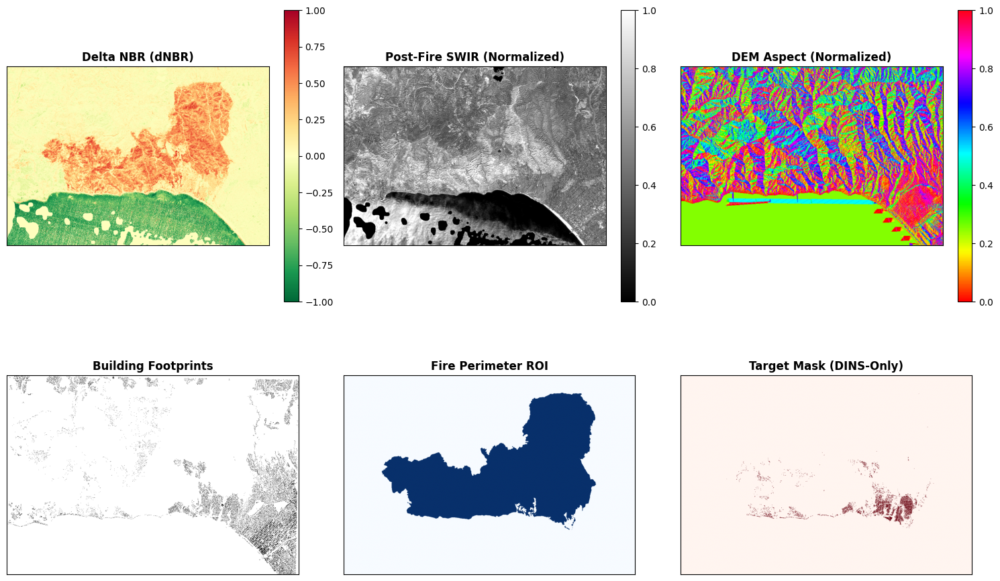

In [89]:
# VISUALIZE PREPROCESSED LAYERS
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# DNBR VISUALIZATION
im0 = axes[0, 0].imshow(channel_dnbr, cmap="RdYlGn_r", vmin=-1, vmax=1.0)
axes[0, 0].set_title("Delta NBR (dNBR)", fontweight="bold")
plt.colorbar(im0, ax=axes[0, 0], fraction=0.05)

# POST-FIRE SWIR VISUALIZATION
im1 = axes[0, 1].imshow(channel_swir, cmap="gray")
axes[0, 1].set_title("Post-Fire SWIR (Normalized)", fontweight="bold")
plt.colorbar(im1, ax=axes[0, 1], fraction=0.05)

# DEM ASPECT VISUALIZATION
im2 = axes[0, 2].imshow(channel_aspect, cmap="hsv")
axes[0, 2].set_title("DEM Aspect (Normalized)", fontweight="bold")
plt.colorbar(im2, ax=axes[0, 2], fraction=0.05)

# BUILDING FOOTPRINTS VISUALIZATION
im3 = axes[1, 0].imshow(channel_buildings, cmap="binary")
axes[1, 0].set_title("Building Footprints", fontweight="bold")

# ROI MASK VISUALIZATION
im4 = axes[1, 1].imshow(aoi_mask, cmap="Blues")
axes[1, 1].set_title("Fire Perimeter ROI", fontweight="bold")

# TARGET MASK VISUALIZATION
im5 = axes[1, 2].imshow(y_target, cmap="Reds")
axes[1, 2].set_title("Target Mask (DINS-Only)", fontweight="bold")

for ax in axes.flat:
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(
    "final_project_files/images/preprocessing_visualization.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

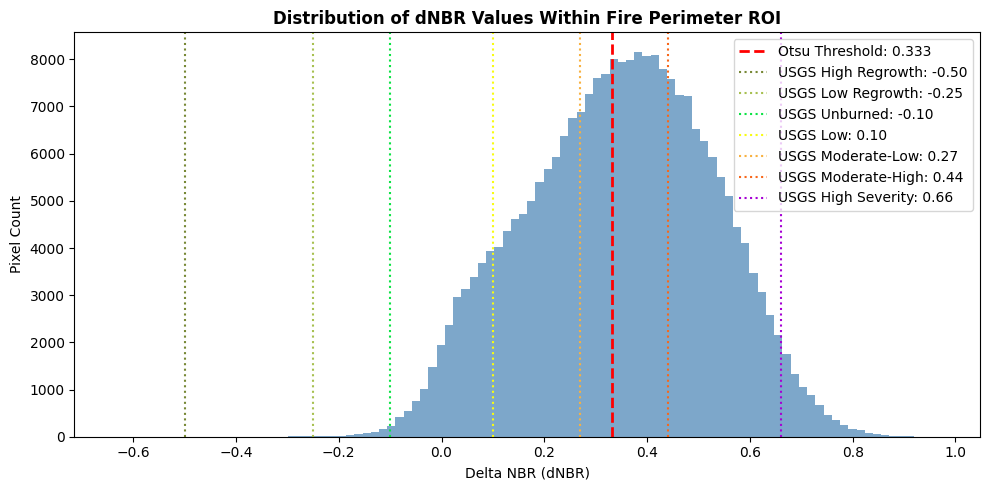

In [90]:
# HISTOGRAM OF DNBR VALUES WITHIN ROI
fig, ax = plt.subplots(figsize=(10, 5))

ax.hist(valid_dnbr_pixels, bins=100, color="steelblue", edgecolor="none", alpha=0.7)
ax.axvline(
    x=otsu_threshold,
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"Otsu Threshold: {otsu_threshold:.3f}",
)
ax.axvline(
    x=-0.5,
    color="#778835",
    linestyle=":",
    linewidth=1.5,
    label="USGS High Regrowth: -0.50",
)
ax.axvline(
    x=-0.25,
    color="#A7C050",
    linestyle=":",
    linewidth=1.5,
    label="USGS Low Regrowth: -0.25",
)
ax.axvline(
    x=-0.1,
    color="#0BE344",
    linestyle=":",
    linewidth=1.5,
    label="USGS Unburned: -0.10",
)
ax.axvline(
    x=0.1,
    color="#F8FC11",
    linestyle=":",
    linewidth=1.5,
    label="USGS Low: 0.10",
)
ax.axvline(
    x=0.27,
    color="#F8B140",
    linestyle=":",
    linewidth=1.5,
    label="USGS Moderate-Low: 0.27",
)
ax.axvline(
    x=0.44,
    color="#F8671A",
    linestyle=":",
    linewidth=1.5,
    label="USGS Moderate-High: 0.44",
)
ax.axvline(
    x=0.66,
    color="#A600D4",
    linestyle=":",
    linewidth=1.5,
    label="USGS High Severity: 0.66",
)

ax.set_xlabel("Delta NBR (dNBR)")
ax.set_ylabel("Pixel Count")
ax.set_title("Distribution of dNBR Values Within Fire Perimeter ROI", fontweight="bold")
ax.legend(loc="upper right")

plt.tight_layout()
plt.savefig(
    "final_project_files/images/dnbr_histogram.png", dpi=300, bbox_inches="tight"
)
plt.show()

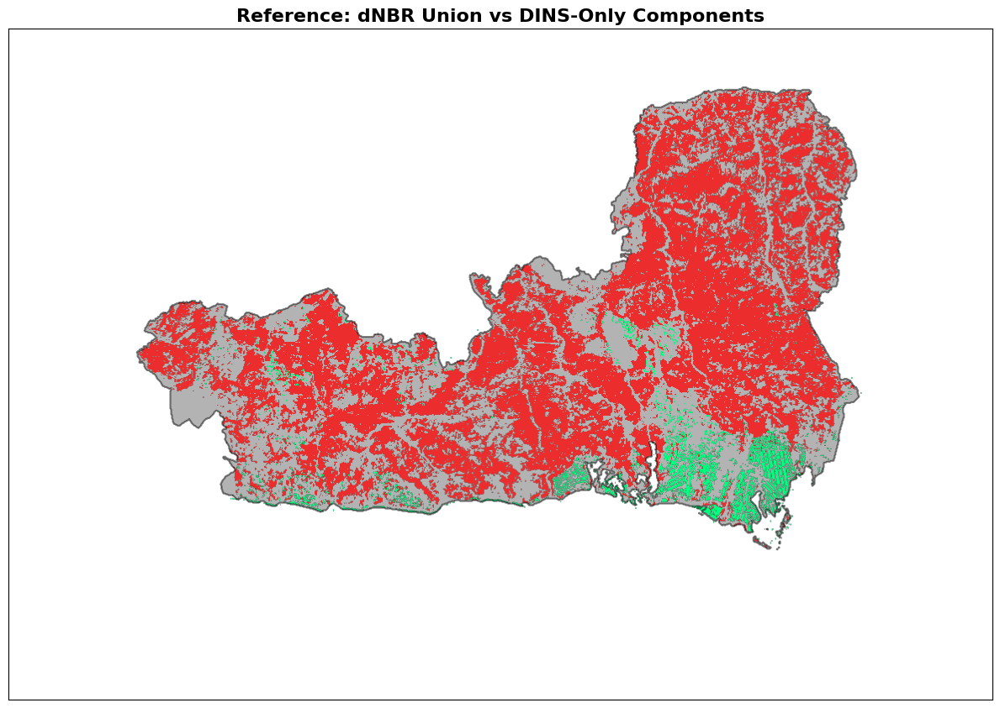

In [91]:
# Composite target mask.
fig, ax = plt.subplots(figsize=(12, 10))

# Background.
# Render area of interest mask in light gray to define unburned region.
ax.imshow(aoi_mask, cmap="Greys", alpha=0.3)

# Vegetation burn scar.
# Mask out unburned pixels so only destroyed canopy renders in dark red.
veg_masked = np.ma.masked_where(vegetation_burn_mask == 0, vegetation_burn_mask == 1)
ax.imshow(veg_masked, cmap="autumn", alpha=0.75)

# Damaged infrastructure.
# Mask out safe pixels to overlay destroyed WUI footprints in bright yellow.
buildings_masked = np.ma.masked_where(damaged_raster == 0, damaged_raster == 1)
ax.imshow(buildings_masked, cmap="winter_r", alpha=1.0)

# Boundary.
# Draw operational fire perimeter as a solid outline using a contour extraction.
ax.contour(aoi_mask, levels=[0.5], colors="black", linewidths=1.5, alpha=0.5)

ax.set_title("Reference: dNBR Union vs DINS-Only Components", fontsize=16, fontweight="bold")
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig(
    "final_project_files/images/final_target_mask.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

## Modeling Approach

This section implements the Baseline Model (Random Forest) and the Primary Model (Topographically Aware U-Net) for semantic segmentation of structural damage. The preprocessing above constructed the 8-channel feature tensor, DINS-only target mask, and AOI mask as in-memory variables.

**Baseline Model (Random Forest):** A pixel-level Random Forest classifier that treats each pixel independently using the 8-channel feature vector. Because it cannot leverage spatial relationships between neighboring pixels, it establishes a performance floor that the U-Net should exceed if spatial context adds value.

**Primary Model (Topographically Aware U-Net):** A U-Net encoder-decoder architecture with skip connections that processes 64x64 pixel patches, enabling the network to capture both fine-grained spectral features and broader spatial context. By feeding topography, building footprints, and multi-temporal spectral bands together, the model can learn complex conditional relationships. For example, high dNBR on a north-facing slope with buildings present likely indicates structural damage, while high dNBR on a north-facing slope without buildings may indicate shadow artifacts.

Both models are evaluated using 5-fold spatial block cross-validation to prevent spatial autocorrelation leakage.

### Feature-Label Independence

The preprocessing pipeline confirmed that the Building Footprints feature channel and the DINS-based target labels are statistically independent (Pearson r ~ 0.19, overlap ~ 38%). Labels were constructed from buffered inspection points, not from building footprint geometries, so the model must learn genuine predictive relationships rather than trivial correlations.

### Spatial K-Fold Cross-Validation

The image is divided into non-overlapping 64x64 pixel blocks assigned to 5 stratified folds. Each fold rotates through train (60%), validation (20%), and test (20%) roles, with every block appearing in the test set exactly once. Block size matches patch size to eliminate spatial leakage at patch boundaries.

In [ ]:
# SET RANDOM SEED FOR REPRODUCIBILITY
random_seed = 42
np.random.seed(random_seed)
tf.random.set_seed(random_seed)

In [93]:
# VERIFY PREPROCESSED DATA FROM PREVIOUS SECTION
# Variables carried forward: X_tensor, y_target, aoi_mask.
height, width, channels = X_tensor.shape

assert X_tensor.shape[2] == 4, "Feature tensor should have 4 channels."
assert y_target.shape == (height, width), "Target mask shape mismatch."
assert aoi_mask.shape == (height, width), "AOI mask shape mismatch."

# CHANNEL NAMES CORRESPOND TO PREPROCESSING TENSOR STACK ORDER
channel_names = [
    "dNBR", "Post-Fire SWIR", "DEM Aspect", "Building Footprints"
]

print(f"Image Dimensions: {height} x {width}")
print(f"Feature Channels: {channels}")
print(f"Target Shape: {y_target.shape}")
print(f"AOI Mask Shape: {aoi_mask.shape}")

Image Dimensions: 801 x 1173
Feature Channels: 4
Target Shape: (801, 1173)
AOI Mask Shape: (801, 1173)


In [94]:
# QUANTIFY CLASS IMBALANCE
# With point-based DINS labels, imbalance characteristics differ from footprint-based.
total_pixels = y_target.size
aoi_pixels = np.sum(aoi_mask == 1)

# Calculate imbalance ratio within AOI only.
y_target_aoi = y_target[aoi_mask == 1]
damaged_in_aoi = np.sum(y_target_aoi == 1)
intact_in_aoi = np.sum(y_target_aoi == 0)
imbalance_ratio = intact_in_aoi / max(damaged_in_aoi, 1)

print(f"Total Pixels: {total_pixels:,}")
print(f"Pixels Inside AOI: {aoi_pixels:,}")
print(f"Damaged Pixels (Class 1): {damaged_in_aoi:,} ({damaged_in_aoi / aoi_pixels * 100:.2f}% of AOI)")
print(f"Intact Pixels (Class 0): {intact_in_aoi:,} ({intact_in_aoi / aoi_pixels * 100:.2f}% of AOI)")
print(f"Class Imbalance Ratio: {imbalance_ratio:.1f}:1")

Total Pixels: 939,573
Pixels Inside AOI: 243,261
Damaged Pixels (Class 1): 9,826 (4.04% of AOI)
Intact Pixels (Class 0): 233,435 (95.96% of AOI)
Class Imbalance Ratio: 23.8:1


## Spatial K-Fold Cross-Validation

### Theoretical Background

Traditional random train/test splits violate the assumption of independence for geospatial data and adjacent pixels are spatially autocorrelated. If training and test pixels are spatially adjacent, the model can achieve artificially high performance by interpolating between known neighbors rather than learning generalizable patterns.

The image is also divided into non-overlapping 64x64 pixel blocks. Each block is assigned to exactly one of 5 folds. Blocks containing damaged structures are stratified to ensure each fold has a representative proportion of the minority class. This prevents situations where one fold contains all the damage and others contain none.

**K-Fold Rotation**

For each of the 5 iterations:
- 1 fold serves as the test set (20% of blocks).
- 1 fold serves as the validation set (20% of blocks).
- 3 folds serve as the training set (60% of blocks).

This rotation ensures every block appears in the test set exactly once across the 5 folds, providing robust metric estimates with confidence intervals.

The block size of 64x64 pixels was chosen to:
1. Match the U-Net input patch size, ensuring patch-block alignment.
2. Provide sufficient spatial context for the convolutional encoder (3 pooling layers: 64 -> 32 -> 16 -> 8).
3. Balance between too-small blocks (insufficient context) and too-large blocks (too few blocks for stratification).

In [95]:
# DEFINE SPATIAL BLOCK PARAMETERS
# Block size determines granularity of spatial stratification.
# Value MUST equal patch_size for U-Net to eliminate spatial leakage.
block_size = 64
n_folds = 5

# Calculate number of blocks in each dimension.
n_blocks_y = int(np.ceil(height / block_size))
n_blocks_x = int(np.ceil(width / block_size))
total_blocks = n_blocks_y * n_blocks_x

print(f"Block Size: {block_size} x {block_size} pixels")
print(f"Grid Dimensions: {n_blocks_y} rows x {n_blocks_x} columns")
print(f"Total Blocks: {total_blocks}")
print(f"Number of Folds: {n_folds}")

Block Size: 64 x 64 pixels
Grid Dimensions: 13 rows x 19 columns
Total Blocks: 247
Number of Folds: 5


In [96]:
# ASSIGN EACH PIXEL TO A SPATIAL BLOCK
# Block indices are computed based on pixel coordinates.
y_indices, x_indices = np.meshgrid(
    np.arange(height),
    np.arange(width),
    indexing = "ij"
)

# Calculate block assignment for each pixel.
block_y = y_indices // block_size
block_x = x_indices // block_size
block_ids = block_y * n_blocks_x + block_x

print(f"Block ID Array Shape: {block_ids.shape}")
print(f"Block ID Range: [{block_ids.min()}, {block_ids.max()}]")

Block ID Array Shape: (801, 1173)
Block ID Range: [0, 246]


In [97]:
# COMPUTE DAMAGE PIXEL COUNT PER BLOCK
# Required for stratified fold assignment.
unique_blocks = np.unique(block_ids)
block_damage_counts = {}
block_aoi_counts = {}

for block_id in unique_blocks:
    block_mask = block_ids == block_id
    block_aoi = aoi_mask[block_mask]
    block_labels = y_target[block_mask]

    # Count damaged pixels within the block that are inside AOI.
    damaged_in_block = np.sum((block_labels == 1) & (block_aoi == 1))
    aoi_in_block = np.sum(block_aoi == 1)

    block_damage_counts[block_id] = damaged_in_block
    block_aoi_counts[block_id] = aoi_in_block

# Separate blocks with and without damaged structures.
blocks_with_damage = [(b, count) for b, count in block_damage_counts.items() if count > 0]
blocks_without_damage = [b for b, count in block_damage_counts.items() if count == 0]

total_damage_pixels = sum([count for _, count in blocks_with_damage])

print(f"Blocks with Damaged Structures: {len(blocks_with_damage)}")
print(f"Blocks without Damaged Structures: {len(blocks_without_damage)}")
print(f"Total Damaged Pixels: {total_damage_pixels:,}")

Blocks with Damaged Structures: 50
Blocks without Damaged Structures: 197
Total Damaged Pixels: 9,826


In [98]:
# CREATE STRATIFIED K-FOLD ASSIGNMENTS
# Blocks with damage are distributed evenly across folds.
np.random.seed(random_seed)

# Create arrays for fold assignment.
all_blocks = list(unique_blocks)
block_has_damage = np.array([1 if block_damage_counts[b] > 0 else 0 for b in all_blocks])

# Use StratifiedKFold to ensure damage blocks are distributed across folds.
skf = StratifiedKFold(n_splits = n_folds, shuffle = True, random_state = random_seed)

# Store fold assignments.
block_to_fold = {}
fold_blocks = {fold: [] for fold in range(n_folds)}

for fold_idx, (train_idx, test_idx) in enumerate(skf.split(all_blocks, block_has_damage)):
    for idx in test_idx:
        block_id = all_blocks[idx]
        block_to_fold[block_id] = fold_idx
        fold_blocks[fold_idx].append(block_id)

# Verify distribution.
for fold in range(n_folds):
    fold_damage_blocks = sum([1 for b in fold_blocks[fold] if block_damage_counts[b] > 0])
    fold_damage_pixels = sum([block_damage_counts[b] for b in fold_blocks[fold]])
    print(f"Fold {fold + 1}: {len(fold_blocks[fold])} blocks, {fold_damage_blocks} with damage, {fold_damage_pixels:,} damage pixels")

Fold 1: 50 blocks, 10 with damage, 1,523 damage pixels
Fold 2: 50 blocks, 10 with damage, 623 damage pixels
Fold 3: 49 blocks, 10 with damage, 3,380 damage pixels
Fold 4: 49 blocks, 10 with damage, 1,486 damage pixels
Fold 5: 49 blocks, 10 with damage, 2,814 damage pixels


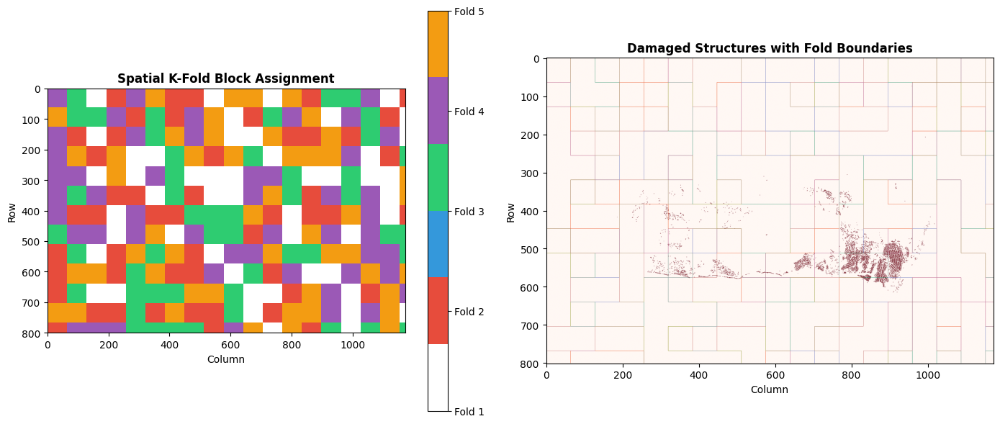

In [99]:
# VISUALIZE FOLD DISTRIBUTION
height, width, _ = X_tensor.shape
fold_visualization = np.zeros((height, width), dtype = np.uint8)

for block_id, fold in block_to_fold.items():
    fold_visualization[block_ids == block_id] = fold + 1

fig, axes = plt.subplots(1, 2, figsize = (14, 6))

# Fold assignments.
cmap_folds = plt.cm.colors.ListedColormap(["white", "#E74C3C", "#3498DB", "#2ECC71", "#9B59B6", "#F39C12"])
im1 = axes[0].imshow(fold_visualization, cmap = cmap_folds, interpolation = "nearest")
axes[0].set_title("Spatial K-Fold Block Assignment", fontsize = 12, fontweight = "bold")
axes[0].set_xlabel("Column")
axes[0].set_ylabel("Row")
cbar1 = plt.colorbar(im1, ax = axes[0], ticks = range(n_folds + 1))
cbar1.set_ticklabels(["Outside"] + [f"Fold {i+1}" for i in range(n_folds)])

# Target mask with fold overlay.
axes[1].imshow(y_target, cmap = "Reds", alpha = 0.7)
for fold in range(n_folds):
    axes[1].contour(fold_visualization == fold + 1, colors = plt.cm.tab10(fold), linewidths = 0.3, alpha = 0.5)
axes[1].set_title("Damaged Structures with Fold Boundaries", fontsize = 12, fontweight = "bold")
axes[1].set_xlabel("Column")
axes[1].set_ylabel("Row")

plt.tight_layout()
plt.savefig(images_path / "spatial_kfold_distribution.png", dpi = 300, bbox_inches = "tight")
plt.show()

In [100]:
def get_fold_masks(test_fold, block_ids, block_to_fold, aoi_mask, n_folds):
    """
    Generate train/val/test masks for a given test fold.

    Parameters:
        test_fold: Index of the fold to use as test set (0 to n_folds-1).
        block_ids: 2D array mapping pixels to block IDs.
        block_to_fold: Dictionary mapping block_id to fold index.
        aoi_mask: 2D boolean array indicating valid AOI pixels.
        n_folds: Total number of folds.

    Returns:
        train_mask_aoi: Boolean mask for training pixels within AOI.
        val_mask_aoi: Boolean mask for validation pixels within AOI.
        test_mask_aoi: Boolean mask for test pixels within AOI.
        train_blocks: Set of block IDs in training set.
        val_blocks: Set of block IDs in validation set.
        test_blocks: Set of block IDs in test set.
    """
    # Validation fold is the one immediately before test (wrapping around).
    val_fold = (test_fold - 1) % n_folds

    # Training folds are all others.
    # train_folds = [f for f in range(n_folds) if f != test_fold and f != val_fold]

    # Assign blocks to sets.
    train_blocks = set()
    val_blocks = set()
    test_blocks = set()

    for block_id, fold in block_to_fold.items():
        if fold == test_fold:
            test_blocks.add(block_id)
        elif fold == val_fold:
            val_blocks.add(block_id)
        else:
            train_blocks.add(block_id)

    # Create pixel-level masks.
    train_mask = np.zeros_like(aoi_mask, dtype = bool)
    val_mask = np.zeros_like(aoi_mask, dtype = bool)
    test_mask = np.zeros_like(aoi_mask, dtype = bool)

    for block_id in train_blocks:
        train_mask[block_ids == block_id] = True
    for block_id in val_blocks:
        val_mask[block_ids == block_id] = True
    for block_id in test_blocks:
        test_mask[block_ids == block_id] = True

    # Apply AOI constraint.
    train_mask_aoi = train_mask & (aoi_mask == 1)
    val_mask_aoi = val_mask & (aoi_mask == 1)
    test_mask_aoi = test_mask & (aoi_mask == 1)

    return train_mask_aoi, val_mask_aoi, test_mask_aoi, train_blocks, val_blocks, test_blocks

In [101]:
# VERIFY FOLD BALANCE
for test_fold in range(n_folds):
    train_mask_aoi, val_mask_aoi, test_mask_aoi, _, _, _ = get_fold_masks(
        test_fold, block_ids, block_to_fold, aoi_mask, n_folds
    )

    train_damage = np.sum(y_target[train_mask_aoi] == 1)
    val_damage = np.sum(y_target[val_mask_aoi] == 1)
    test_damage = np.sum(y_target[test_mask_aoi] == 1)

    train_total = np.sum(train_mask_aoi)
    val_total = np.sum(val_mask_aoi)
    test_total = np.sum(test_mask_aoi)

    print(f"Fold {test_fold + 1} as Test:")
    print(f"  Train: {train_damage:,} damage / {train_total:,} total ({train_damage / max(train_total, 1) * 100:.2f}%)")
    print(f"  Val:   {val_damage:,} damage / {val_total:,} total ({val_damage / max(val_total, 1) * 100:.2f}%)")
    print(f"  Test:  {test_damage:,} damage / {test_total:,} total ({test_damage / max(test_total, 1) * 100:.2f}%)")
    print()

Fold 1 as Test:
  Train: 5,489 damage / 141,772 total (3.87%)
  Val:   2,814 damage / 52,113 total (5.40%)
  Test:  1,523 damage / 49,376 total (3.08%)

Fold 2 as Test:
  Train: 7,680 damage / 141,898 total (5.41%)
  Val:   1,523 damage / 49,376 total (3.08%)
  Test:  623 damage / 51,987 total (1.20%)

Fold 3 as Test:
  Train: 5,823 damage / 147,386 total (3.95%)
  Val:   623 damage / 51,987 total (1.20%)
  Test:  3,380 damage / 43,888 total (7.70%)

Fold 4 as Test:
  Train: 4,960 damage / 153,476 total (3.23%)
  Val:   3,380 damage / 43,888 total (7.70%)
  Test:  1,486 damage / 45,897 total (3.24%)

Fold 5 as Test:
  Train: 5,526 damage / 145,251 total (3.80%)
  Val:   1,486 damage / 45,897 total (3.24%)
  Test:  2,814 damage / 52,113 total (5.40%)



## Baseline Model: Random Forest with Spatial K-Fold CV

The Random Forest classifier is trained and evaluated using 5-fold spatial cross-validation. Each fold trains on 60% of blocks (3 folds), validates on 20% (1 fold), and tests on 20% (1 fold). Final metrics are reported as mean ± standard deviation across the 5 test folds.

In [102]:
# RANDOM FOREST K-FOLD CROSS-VALIDATION
rf_fold_results = {
    "f1_train": [],
    "f1_val": [],
    "f1_test": [],
    "iou_train": [],
    "iou_val": [],
    "iou_test": [],
    "feature_importance": []
}

for fold in range(n_folds):
    print(f"FOLD {fold + 1}/{n_folds}")

    # Get fold masks.
    train_mask_aoi, val_mask_aoi, test_mask_aoi, _, _, _ = get_fold_masks(
        fold, block_ids, block_to_fold, aoi_mask, n_folds
    )

    # Extract pixel data.
    X_train_rf = np.nan_to_num(X_tensor[train_mask_aoi], nan = 0.0)
    y_train_rf = y_target[train_mask_aoi]
    X_val_rf = np.nan_to_num(X_tensor[val_mask_aoi], nan = 0.0)
    y_val_rf = y_target[val_mask_aoi]
    X_test_rf = np.nan_to_num(X_tensor[test_mask_aoi], nan = 0.0)
    y_test_rf = y_target[test_mask_aoi]

    print(f"  Train: {X_train_rf.shape[0]:,} pixels | Val: {X_val_rf.shape[0]:,} | Test: {X_test_rf.shape[0]:,}")

    # Train Random Forest.
    rf_classifier = RandomForestClassifier(
        n_estimators = 100,
        max_depth = 15,
        min_samples_split = 5,
        min_samples_leaf = 2,
        class_weight = "balanced",
        random_state = random_seed,
        n_jobs = -1,
        verbose = 0
    )
    rf_classifier.fit(X_train_rf, y_train_rf)

    # Predict on all splits.
    y_pred_train = rf_classifier.predict(X_train_rf)
    y_pred_val = rf_classifier.predict(X_val_rf)
    y_pred_test = rf_classifier.predict(X_test_rf)

    # Calculate metrics.
    f1_train = f1_score(y_train_rf, y_pred_train, average = "binary", zero_division = 0)
    f1_val = f1_score(y_val_rf, y_pred_val, average = "binary", zero_division = 0)
    f1_test = f1_score(y_test_rf, y_pred_test, average = "binary", zero_division = 0)

    iou_train = jaccard_score(y_train_rf, y_pred_train, average = "binary", zero_division = 0)
    iou_val = jaccard_score(y_val_rf, y_pred_val, average = "binary", zero_division = 0)
    iou_test = jaccard_score(y_test_rf, y_pred_test, average = "binary", zero_division = 0)

    # Store results.
    rf_fold_results["f1_train"].append(f1_train)
    rf_fold_results["f1_val"].append(f1_val)
    rf_fold_results["f1_test"].append(f1_test)
    rf_fold_results["iou_train"].append(iou_train)
    rf_fold_results["iou_val"].append(iou_val)
    rf_fold_results["iou_test"].append(iou_test)
    rf_fold_results["feature_importance"].append(rf_classifier.feature_importances_)

    print(f"  Test F1: {f1_test:.4f} | Test IoU: {iou_test:.4f}")

FOLD 1/5
  Train: 141,772 pixels | Val: 52,113 | Test: 49,376
  Test F1: 0.2380 | Test IoU: 0.1351
FOLD 2/5
  Train: 141,898 pixels | Val: 49,376 | Test: 51,987
  Test F1: 0.1649 | Test IoU: 0.0899
FOLD 3/5
  Train: 147,386 pixels | Val: 51,987 | Test: 43,888
  Test F1: 0.4835 | Test IoU: 0.3188
FOLD 4/5
  Train: 153,476 pixels | Val: 43,888 | Test: 45,897
  Test F1: 0.3196 | Test IoU: 0.1902
FOLD 5/5
  Train: 145,251 pixels | Val: 45,897 | Test: 52,113
  Test F1: 0.3765 | Test IoU: 0.2319


In [103]:
# AGGREGATE RANDOM FOREST RESULTS
rf_f1_mean = np.mean(rf_fold_results["f1_test"])
rf_f1_std = np.std(rf_fold_results["f1_test"])
rf_iou_mean = np.mean(rf_fold_results["iou_test"])
rf_iou_std = np.std(rf_fold_results["iou_test"])

# Average feature importance across folds.
rf_feature_importance_mean = np.mean(rf_fold_results["feature_importance"], axis = 0)
rf_feature_importance_std = np.std(rf_fold_results["feature_importance"], axis = 0)

print("Test Set Metrics (mean +/- std)")
print(f"  F1 Score: {rf_f1_mean:.4f} +/- {rf_f1_std:.4f}")
print(f"  IoU:      {rf_iou_mean:.4f} +/- {rf_iou_std:.4f}")
print()
print("Feature Importance (mean +/- std)")
for idx, name in enumerate(channel_names):
    print(f"  {name}: {rf_feature_importance_mean[idx]:.4f} +/- {rf_feature_importance_std[idx]:.4f}")

Test Set Metrics (mean +/- std)
  F1 Score: 0.3165 +/- 0.1101
  IoU:      0.1932 +/- 0.0792

Feature Importance (mean +/- std)
  dNBR: 0.4579 +/- 0.0120
  Post-Fire SWIR: 0.2582 +/- 0.0144
  DEM Aspect: 0.1126 +/- 0.0089
  Building Footprints: 0.1712 +/- 0.0080


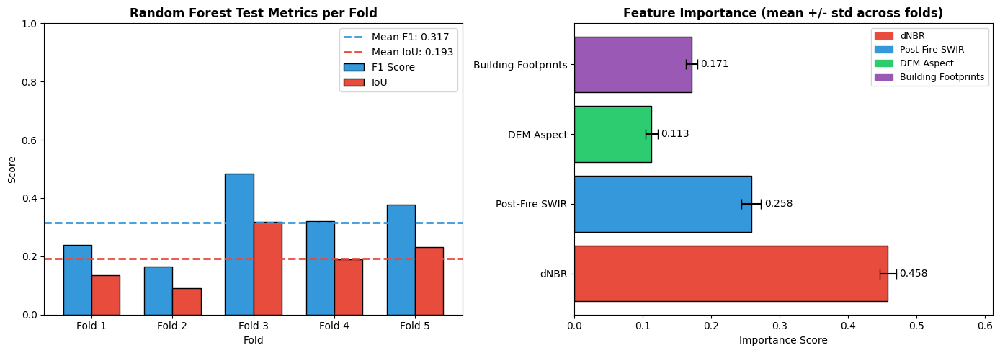

In [124]:
# VISUALIZE RANDOM FOREST K-FOLD RESULTS
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# F1 and IoU per fold.
fold_labels = [f"Fold {i+1}" for i in range(n_folds)]
x_pos = np.arange(n_folds)
width = 0.35

axes[0].bar(x_pos - width/2, rf_fold_results["f1_test"], width, label="F1 Score", color="#3498DB", edgecolor="black")
axes[0].bar(x_pos + width/2, rf_fold_results["iou_test"], width, label="IoU", color="#E74C3C", edgecolor="black")
axes[0].axhline(y=rf_f1_mean, color="#3498DB", linestyle="--", linewidth=2, label=f"Mean F1: {rf_f1_mean:.3f}")
axes[0].axhline(y=rf_iou_mean, color="#E74C3C", linestyle="--", linewidth=2, label=f"Mean IoU: {rf_iou_mean:.3f}")
axes[0].set_xlabel("Fold")
axes[0].set_ylabel("Score")
axes[0].set_title("Random Forest Test Metrics per Fold", fontsize=12, fontweight="bold")
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(fold_labels)
axes[0].legend(loc="upper right")
axes[0].set_ylim(0, 1)

# Feature importance with error bars.
colors = ["#E74C3C", "#3498DB", "#2ECC71", "#9B59B6"]
axes[1].barh(channel_names, rf_feature_importance_mean, xerr=rf_feature_importance_std, color=colors, edgecolor="black", capsize=5)
axes[1].set_xlabel("Importance Score")
axes[1].set_title("Feature Importance (mean +/- std across folds)", fontsize=12, fontweight="bold")
axes[1].set_xlim(0, max(rf_feature_importance_mean + rf_feature_importance_std) * 1.3)

# Add value labels.
for idx, (mean, std) in enumerate(zip(rf_feature_importance_mean, rf_feature_importance_std)):
    axes[1].text(mean + std + 0.005, idx, f"{mean:.3f}", va="center", fontsize=10)

# Add legend for channel colors.
legend_patches = [mpatches.Patch(color=c, label=n) for c, n in zip(colors, channel_names)]
axes[1].legend(handles=legend_patches, loc="upper right", fontsize=9)

plt.tight_layout()
plt.savefig(images_path / "rf_kfold_results.png", dpi=300, bbox_inches="tight")
plt.show()

## Primary Model: Topographically Aware U-Net with Spatial K-Fold CV

### Theoretical Background

The U-Net architecture enables precise localization while maintaining global context through skip connections. With patch-block alignment (64x64 patches matching 64x64 blocks), spatial leakage is eliminated.

### U-Net Architecture Overview

The U-Net consists of three main components:

1. **Encoder Path**: A series of convolutional blocks followed by max pooling operations that progressively reduce spatial resolution while increasing feature depth. This captures "what" is in the image.

2. **Bottleneck**: The deepest part of the network where the most abstract features are learned.

3. **Decoder Path**: A series of transposed convolutions (upsampling) that progressively restore spatial resolution. Skip connections concatenate encoder features with decoder features at matching resolutions, preserving fine-grained spatial information lost during pooling.

### Architectural Constraints for 64x64 Input

With a 64x64 input patch, the encoder can perform at most 3 pooling operations before the spatial dimensions become too small:
- **Level 1**: 64x64 -> 32x32 (after first pooling)
- **Level 2**: 32x32 -> 16x16 (after second pooling)
- **Level 3**: 16x16 -> 8x8 (after third pooling)
- **Bottleneck**: 8x8 (minimum viable spatial dimension)

The decoder mirrors this structure, upsampling back to 64x64.

### Loss Functions for Severe Class Imbalance

With class imbalance ratios exceeding 40:1, standard binary cross-entropy loss fails because the model can achieve high accuracy by predicting the majority class (intact) for all pixels. Two specialized loss functions address this:

1. **Dice Loss**: Directly optimizes the F1-Score (Dice Coefficient), the harmonic mean of precision and recall. It treats false positives and false negatives equally, making it robust to class imbalance.

2. **Focal Loss**: Down-weights easy-to-classify background pixels by applying a focusing parameter (gamma) that reduces the contribution of confident predictions. This focuses learning on hard-to-classify minority pixels.

**Combined Loss**: A weighted sum of Dice Loss and Focal Loss provides both direct metric optimization and focused attention on minority class examples.

### Define Custom Loss Functions

Implement the Dice Loss and Combined Loss functions.

With class imbalance ratios exceeding 23:1, standard binary cross-entropy loss fails because the model can achieve high accuracy by predicting the majority class (intact) for all pixels. Two specialized loss functions address this:

1. **Dice Loss**: Directly optimizes the F1-Score (Dice Coefficient), the harmonic mean of precision and recall. It treats false positives and false negatives equally, making it robust to class imbalance.

2. **Focal Loss**: Down-weights easy-to-classify background pixels by applying a focusing parameter (gamma) that reduces the contribution of confident predictions. This focuses learning on hard-to-classify minority pixels.

**Combined Loss**: A weighted sum of Dice Loss and Focal Loss provides both direct metric optimization and focused attention on minority class examples.

In [105]:
# DICE LOSS FUNCTION
# Directly optimizes F1-Score (Dice Coefficient) for binary segmentation.
# Formula: Dice Loss = 1 - (2 * |A ∩ B| + smooth) / (|A| + |B| + smooth)
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_flat = K.flatten(K.cast(y_true, tf.float32))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    union = K.sum(y_true_flat) + K.sum(y_pred_flat)
    return 1.0 - (2.0 * intersection + smooth) / (union + smooth)

In [106]:
# COMBINED LOSS FUNCTION
# Weighted sum of Dice Loss and Focal Loss.
# Dice Loss: optimizes F1-Score directly.
# Focal Loss: focuses learning on hard minority-class pixels.
focal_loss_fn = BinaryFocalCrossentropy(
    apply_class_balancing=True, alpha=0.80, gamma=2.0, from_logits=False
)

def combined_loss(y_true, y_pred, dice_weight=0.5, focal_weight=0.5):
    dice_component  = dice_loss(y_true, y_pred)
    focal_component = focal_loss_fn(y_true, y_pred)
    return dice_weight * dice_component + focal_weight * focal_component

### Define Custom Metrics

Implement Dice Coefficient and IoU as Keras-compatible metrics.

In [107]:
# DICE COEFFICIENT METRIC
# Tracks Dice score during training (same formula as loss, but returns the coefficient).
def dice_coef_metric(y_true, y_pred, smooth=1e-6):
    y_true_flat = K.flatten(K.cast(y_true, tf.float32))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    union = K.sum(y_true_flat) + K.sum(y_pred_flat)
    return (2.0 * intersection + smooth) / (union + smooth)

In [108]:
# IOU METRIC (JACCARD INDEX)
# Tracks Intersection over Union during training.
# Predictions are binarised at 0.5 before computing overlap.
def iou_metric(y_true, y_pred, threshold=0.5, smooth=1e-6):
    y_pred_binary = K.cast(y_pred > threshold, tf.float32)
    y_true_flat   = K.flatten(K.cast(y_true, tf.float32))
    y_pred_flat   = K.flatten(y_pred_binary)
    intersection  = K.sum(y_true_flat * y_pred_flat)
    union         = K.sum(y_true_flat) + K.sum(y_pred_flat) - intersection
    return (intersection + smooth) / (union + smooth)

### Define U-Net Architecture

Build the U-Net architecture optimized for 64x64 input patches.

**Architecture Specs**:
- **Input shape**: (64, 64, 8) - 8 channels from feature tensor
- **Base filters**: 32 (doubles at each encoder level)
- **Encoder levels**: 3 (64 -> 32 -> 16 -> 8)
- **Bottleneck**: 8x8 spatial resolution
- **Decoder levels**: 3 (8 -> 16 -> 32 -> 64)
- **Output**: Single channel with sigmoid activation (binary segmentation)

In [109]:
# CONVOLUTIONAL BLOCK HELPER
# Two Conv2D layers each followed by BatchNorm + ReLU, then optional Dropout.
# He-normal initialisation pairs well with ReLU activations.
def conv_block(inputs, filters, kernel_size=3, dropout_rate=0.1):
    x = Conv2D(filters, kernel_size, padding="same", kernel_initializer="he_normal")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(filters, kernel_size, padding="same", kernel_initializer="he_normal")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)
    return x

In [110]:
# TOPOGRAPHICALLY AWARE U-NET ARCHITECTURE
# Input: (64, 64, 4) — dNBR | Post-SWIR | Aspect | Buildings
# Encoder: 64 -> 32 -> 16 -> 8 | Bottleneck: 8×8 | Decoder: 8 -> 16 -> 32 -> 64
# Skip connections concatenate encoder feature maps into each decoder level.
def build_unet_64(input_shape, num_classes=1, base_filters=32):
    inputs = Input(shape=input_shape)

    # ENCODER
    enc1  = conv_block(inputs, base_filters,     dropout_rate=0.1)   # 64×64×32
    pool1 = MaxPooling2D(pool_size=(2, 2))(enc1)                      # 32×32×32

    enc2  = conv_block(pool1,  base_filters * 2, dropout_rate=0.1)   # 32×32×64
    pool2 = MaxPooling2D(pool_size=(2, 2))(enc2)                      # 16×16×64

    enc3  = conv_block(pool2,  base_filters * 4, dropout_rate=0.2)   # 16×16×128
    pool3 = MaxPooling2D(pool_size=(2, 2))(enc3)                      # 8×8×128

    # BOTTLENECK
    bottleneck = conv_block(pool3, base_filters * 8, dropout_rate=0.3)  # 8×8×256

    # DECODER
    up3  = Conv2DTranspose(base_filters * 4, (2, 2), strides=(2, 2), padding="same")(bottleneck)
    up3  = concatenate([up3, enc3])                                   # 16×16×256
    dec3 = conv_block(up3, base_filters * 4, dropout_rate=0.2)

    up2  = Conv2DTranspose(base_filters * 2, (2, 2), strides=(2, 2), padding="same")(dec3)
    up2  = concatenate([up2, enc2])                                   # 32×32×128
    dec2 = conv_block(up2, base_filters * 2, dropout_rate=0.1)

    up1  = Conv2DTranspose(base_filters,     (2, 2), strides=(2, 2), padding="same")(dec2)
    up1  = concatenate([up1, enc1])                                   # 64×64×64
    dec1 = conv_block(up1, base_filters, dropout_rate=0.1)

    # OUTPUT
    outputs = Conv2D(num_classes, (1, 1), activation="sigmoid")(dec1)  # 64×64×1

    model = Model(inputs=inputs, outputs=outputs, name="TopographicallyAwareUNet_64")
    return model

### Define Patch Extraction Function

Implement aligned patch extraction for train/val/test splits.

**Notes**:
- Extract non-overlapping 64x64 patches that align with spatial blocks
- Assign patches to train/val/test based on the fold of their center pixel's block
- Only include patches with at least 10% valid AOI coverage
- Oversample training patches containing damaged pixels (add 2 extra copies)
- Handle NaN values by replacing with 0.0

In [111]:
# DEFINE PATCH SIZE (MUST EQUAL BLOCK SIZE)
patch_size = 64

print(f"Patch Size: {patch_size} x {patch_size} pixels")
print(f"Block Size: {block_size} x {block_size} pixels")
print(f"Patch-Block Alignment: {patch_size == block_size}")

Patch Size: 64 x 64 pixels
Block Size: 64 x 64 pixels
Patch-Block Alignment: True


In [112]:
# PATCH EXTRACTION FUNCTION
# Extracts non-overlapping 64×64 patches aligned to spatial blocks.
# Patches are routed to train/val/test based on their block's fold assignment.
# Training patches containing damaged pixels are oversampled ×2 to counter the severe class imbalance.
def extract_fold_patches(X_tensor, y_target, aoi_mask, block_ids,
                         block_to_fold, test_fold, patch_size, n_folds):
    val_fold = (test_fold - 1) % n_folds
    height, width, channels = X_tensor.shape

    train_X, train_y, train_dmg = [], [], []
    val_X,   val_y              = [], []
    test_X,  test_y             = [], []

    for row in range(0, height - patch_size + 1, patch_size):
        for col in range(0, width - patch_size + 1, patch_size):
            # Skip patches with less than 10% valid AOI coverage.
            mask_patch   = aoi_mask[row:row + patch_size, col:col + patch_size]
            valid_ratio  = np.mean(mask_patch)
            if valid_ratio < 0.10:
                continue

            X_patch = X_tensor[row:row + patch_size, col:col + patch_size, :]
            y_patch = y_target[row:row + patch_size, col:col + patch_size]

            # Determine fold from the center pixel's block.
            cr = row + patch_size // 2
            cc = col + patch_size // 2
            block_id = block_ids[cr, cc]
            if block_id not in block_to_fold:
                continue

            fold        = block_to_fold[block_id]
            dmg_pixels  = np.sum(y_patch == 1)

            if fold == test_fold:
                test_X.append(X_patch)
                test_y.append(y_patch)
            elif fold == val_fold:
                val_X.append(X_patch)
                val_y.append(y_patch)
            else:
                train_X.append(X_patch)
                train_y.append(y_patch)
                train_dmg.append(dmg_pixels)

    # Oversample training patches that contain damaged pixels (×2 extra copies).
    n_orig = len(train_X)
    for i in range(n_orig):
        if train_dmg[i] > 0:
            train_X.extend([train_X[i]] * 2)
            train_y.extend([train_y[i]] * 2)

    # Helper: list → float32 ndarray, NaN → 0, add channel dim to labels.
    def pack_X(patches):
        if not patches:
            return np.empty((0, patch_size, patch_size, channels), dtype=np.float32)
        return np.nan_to_num(np.array(patches, dtype=np.float32), nan=0.0)

    def pack_y(patches):
        if not patches:
            return np.empty((0, patch_size, patch_size, 1), dtype=np.float32)
        return np.array(patches, dtype=np.float32)[..., np.newaxis]

    return pack_X(train_X), pack_y(train_y), \
           pack_X(val_X),   pack_y(val_y),   \
           pack_X(test_X),  pack_y(test_y)

### K-Fold Training Loop

Implement the 5-fold cross-validation training loop for U-Net.

- Train a fresh model for each fold (clear Keras session).
- Normalize features using StandardScaler fit only on training data.
- Use Adam optimizer with learning rate 1e-3 could be good.
- Apply early stopping with patience 15 and learning rate reduction on plateau.
- Train for maximum 75 epochs with batch size 8.
- Evaluate using F1-score and IoU on test patches.
- Store results for aggregation.

In [114]:
# U-NET 5-FOLD SPATIAL CROSS-VALIDATION TRAINING LOOP
# Each fold: 3 folds train | 1 fold val | 1 fold test.
# Features are normalised with a StandardScaler fit only on training data.
# A fresh model is built and compiled for every fold to prevent weight leakage.
unet_fold_results = {
    "f1_test":       [],
    "iou_test":      [],
    "best_val_dice": [],
    "epochs_trained": []
}

print(f"Patch Size: {patch_size} × {patch_size} | Block Size: {block_size} × {block_size} | Aligned: {patch_size == block_size}\n")

for fold in range(n_folds):
    print(f"FOLD {fold + 1}/{n_folds}")

    # PATCH EXTRACTION
    X_train, y_train, X_val, y_val, X_test, y_test = extract_fold_patches(
        X_tensor, y_target, aoi_mask, block_ids,
        block_to_fold, fold, patch_size, n_folds
    )
    print(f"  Patches — Train: {len(X_train)}  Val: {len(X_val)}  Test: {len(X_test)}")

    if len(X_train) < 4 or len(X_val) < 1 or len(X_test) < 1:
        print(f"  Insufficient data — skipping fold {fold + 1}.")
        unet_fold_results["f1_test"].append(np.nan)
        unet_fold_results["iou_test"].append(np.nan)
        unet_fold_results["best_val_dice"].append(np.nan)
        unet_fold_results["epochs_trained"].append(0)
        continue

    # FEATURE NORMALISATION
    scaler = StandardScaler()
    scaler.fit(X_train.reshape(-1, channels))
    X_train = scaler.transform(X_train.reshape(-1, channels)).reshape(X_train.shape)
    X_val   = scaler.transform(X_val.reshape(-1, channels)).reshape(X_val.shape)
    X_test  = scaler.transform(X_test.reshape(-1, channels)).reshape(X_test.shape)

    # MODEL
    tf.keras.backend.clear_session()
    model = build_unet_64(
        input_shape=(patch_size, patch_size, channels),
        num_classes=1,
        base_filters=32
    )
    model.compile(
        optimizer=Adam(learning_rate=1e-3),
        loss=combined_loss,
        metrics=[dice_coef_metric, iou_metric]
    )

    # CALLBACKS
    callbacks = [
        EarlyStopping(
            monitor="val_loss", patience=15,
            restore_best_weights=True, verbose=0
        ),
        ReduceLROnPlateau(
            monitor="val_loss", factor=0.5, patience=7,
            min_lr=1e-6, verbose=0
        ),
    ]

    # TRAINING
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=75,
        batch_size=8,
        callbacks=callbacks,
        verbose=1
    )

    # EVALUATION
    y_pred_proba  = model.predict(X_test, verbose=0)
    y_pred_binary = (y_pred_proba > 0.5).astype(np.uint8)

    y_test_flat = y_test.flatten().astype(np.uint8)
    y_pred_flat = y_pred_binary.flatten()

    f1_test       = f1_score(y_test_flat, y_pred_flat, average="binary", zero_division=0)
    iou_test      = jaccard_score(y_test_flat, y_pred_flat, average="binary", zero_division=0)
    best_val_dice = max(history.history.get("val_dice_coef_metric", [0.0]))
    epochs_trained = len(history.history["loss"])

    unet_fold_results["f1_test"].append(f1_test)
    unet_fold_results["iou_test"].append(iou_test)
    unet_fold_results["best_val_dice"].append(best_val_dice)
    unet_fold_results["epochs_trained"].append(epochs_trained)

    print(f"  Test F1: {f1_test:.4f}  |  Test IoU: {iou_test:.4f}  |  Epochs: {epochs_trained}")

Patch Size: 64 × 64 | Block Size: 64 × 64 | Aligned: True

FOLD 1/5
  Patches — Train: 99  Val: 15  Test: 17
Epoch 1/75
13/13 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step - dice_coef_metric: 0.1732 - iou_metric: 0.1916 - loss: 0.4310 - val_dice_coef_metric: 0.0931 - val_iou_metric: 0.0507 - val_loss: 5.1099 - learning_rate: 0.0010
Epoch 2/75
13/13 ━━━━━━━━━━━━━━━━━━━━ 13s 963ms/step - dice_coef_metric: 0.2365 - iou_metric: 0.2552 - loss: 0.3964 - val_dice_coef_metric: 0.0942 - val_iou_metric: 0.0510 - val_loss: 1.6009 - learning_rate: 0.0010
Epoch 3/75
13/13 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - dice_coef_metric: 0.2745 - iou_metric: 0.2825 - loss: 0.3720 - val_dice_coef_metric: 0.0989 - val_iou_metric: 0.0530 - val_loss: 1.0170 - learning_rate: 0.0010
Epoch 4/75
13/13 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - dice_coef_metric: 0.3139 - iou_metric: 0.3015 - loss: 0.3510 - val_dice_coef_metric: 0.1123 - val_iou_metric: 0.0623 - val_loss: 0.7802 - learning_rate: 0.0010
Epoch 5/75
13/13 ━━━━━━━━━━━━━━━━━━━━ 12

  Test F1: 0.5618  |  Test IoU: 0.3906  |  Epochs: 38


### Aggregate U-Net Results

Calculate mean and standard deviation of metrics across folds.

In [115]:
# AGGREGATE U-NET RESULTS ACROSS FOLDS
valid_f1  = [x for x in unet_fold_results["f1_test"]  if not np.isnan(x)]
valid_iou = [x for x in unet_fold_results["iou_test"] if not np.isnan(x)]

unet_f1_mean  = np.mean(valid_f1)  if valid_f1  else 0.0
unet_f1_std   = np.std(valid_f1)   if valid_f1  else 0.0
unet_iou_mean = np.mean(valid_iou) if valid_iou else 0.0
unet_iou_std  = np.std(valid_iou)  if valid_iou else 0.0

print("U-Net Test Set Metrics (mean ± std across valid folds)")
print(f"  F1 Score:      {unet_f1_mean:.4f} ± {unet_f1_std:.4f}")
print(f"  IoU:           {unet_iou_mean:.4f} ± {unet_iou_std:.4f}")
print(f"  Best Val Dice: {np.nanmean(unet_fold_results['best_val_dice']):.4f}")
print(f"  Avg Epochs:    {np.nanmean(unet_fold_results['epochs_trained']):.1f}")

U-Net Test Set Metrics (mean ± std across valid folds)
  F1 Score:      0.5034 ± 0.0631
  IoU:           0.3387 ± 0.0552
  Best Val Dice: 0.3750
  Avg Epochs:    37.0


### Visualize U-Net Results

Create bar chart showing F1 and IoU per fold with mean lines.

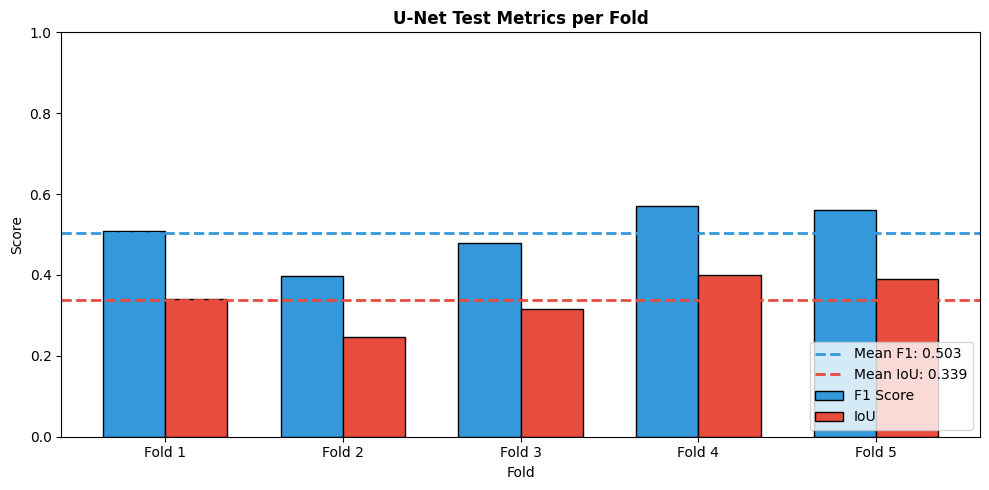

In [116]:
# VISUALIZE U-NET K-FOLD RESULTS
fig, ax = plt.subplots(figsize=(10, 5))

fold_labels = [f"Fold {i + 1}" for i in range(n_folds)]
x_pos = np.arange(n_folds)
width = 0.35

f1_vals  = [0.0 if np.isnan(x) else x for x in unet_fold_results["f1_test"]]
iou_vals = [0.0 if np.isnan(x) else x for x in unet_fold_results["iou_test"]]

ax.bar(x_pos - width / 2, f1_vals,  width, label="F1 Score", color="#3498DB", edgecolor="black")
ax.bar(x_pos + width / 2, iou_vals, width, label="IoU",      color="#E74C3C", edgecolor="black")
ax.axhline(y=unet_f1_mean,  color="#3498DB", linestyle="--", linewidth=2,
           label=f"Mean F1: {unet_f1_mean:.3f}")
ax.axhline(y=unet_iou_mean, color="#E74C3C", linestyle="--", linewidth=2,
           label=f"Mean IoU: {unet_iou_mean:.3f}")

ax.set_xlabel("Fold")
ax.set_ylabel("Score")
ax.set_title("U-Net Test Metrics per Fold", fontsize=12, fontweight="bold")
ax.set_xticks(x_pos)
ax.set_xticklabels(fold_labels)
ax.legend(loc="lower right")
ax.set_ylim(0, 1)

plt.tight_layout()
plt.savefig(images_path / "unet_kfold_results.png", dpi=300, bbox_inches="tight")
plt.show()

## Model Comparison and Final Summary

Compare Random Forest baseline against U-Net primary model.

In [117]:
# MODEL COMPARISON: RANDOM FOREST vs U-NET
f1_diff  = unet_f1_mean  - rf_f1_mean
iou_diff = unet_iou_mean - rf_iou_mean

print("MODEL COMPARISON: 5-Fold Spatial Cross-Validation")
print()
print(f"{'Model':<25} {'F1':>12} {'IoU':>12}")
print(f"{'Random Forest':<25} {rf_f1_mean:.4f} ± {rf_f1_std:.4f}   {rf_iou_mean:.4f} ± {rf_iou_std:.4f}")
print(f"{'U-Net':<25} {unet_f1_mean:.4f} ± {unet_f1_std:.4f}   {unet_iou_mean:.4f} ± {unet_iou_std:.4f}")
print()
print(f"{'Δ (U-Net − RF)':<25} {f1_diff:+.4f}{'':>12}  {iou_diff:+.4f}")
print()
print(f"F1 -> {'improvement' if f1_diff  > 0 else 'regression'} of {abs(f1_diff):.4f}")
print(f"IoU -> {'improvement' if iou_diff > 0 else 'regression'} of {abs(iou_diff):.4f}")

MODEL COMPARISON: 5-Fold Spatial Cross-Validation

Model                               F1          IoU
Random Forest             0.3165 ± 0.1101   0.1932 ± 0.0792
U-Net                     0.5034 ± 0.0631   0.3387 ± 0.0552

Δ (U-Net − RF)            +0.1869              +0.1455

F1 -> improvement of 0.1869
IoU -> improvement of 0.1455


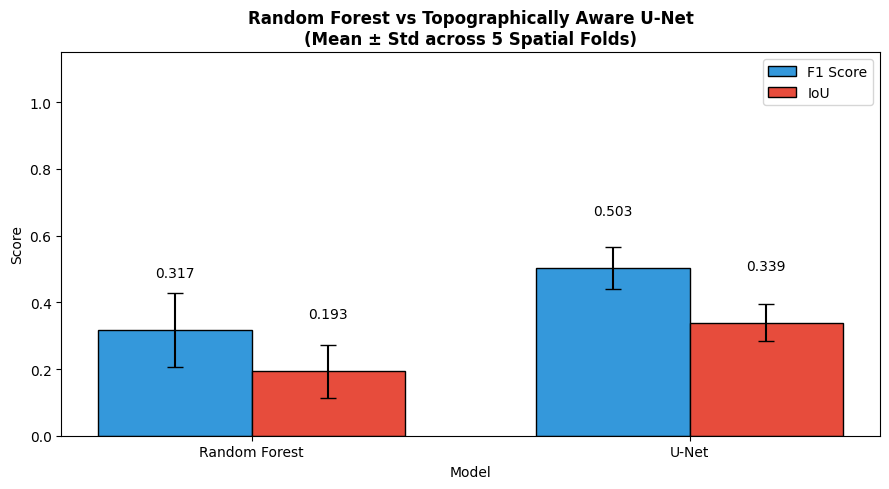

In [123]:
# VISUALIZE MODEL COMPARISON
fig, ax = plt.subplots(figsize=(9, 5))

model_labels = ["Random Forest", "U-Net"]
f1_means  = [rf_f1_mean,  unet_f1_mean]
f1_stds   = [rf_f1_std,   unet_f1_std]
iou_means = [rf_iou_mean, unet_iou_mean]
iou_stds  = [rf_iou_std,  unet_iou_std]

x_pos = np.arange(len(model_labels))
width = 0.35

bars_f1  = ax.bar(x_pos - width / 2, f1_means,  width, yerr=f1_stds,
                  label="F1 Score", color="#3498DB", edgecolor="black", capsize=6)
bars_iou = ax.bar(x_pos + width / 2, iou_means, width, yerr=iou_stds,
                  label="IoU",      color="#E74C3C", edgecolor="black", capsize=6)

for bar in bars_f1:
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.15,
            f"{bar.get_height():.3f}", ha="center", va="bottom", fontsize=10)
for bar in bars_iou:
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.15,
            f"{bar.get_height():.3f}", ha="center", va="bottom", fontsize=10)

ax.set_xlabel("Model")
ax.set_ylabel("Score")
ax.set_title("Random Forest vs Topographically Aware U-Net\n(Mean ± Std across 5 Spatial Folds)",
             fontsize=12, fontweight="bold")
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels)
ax.legend()
ax.set_ylim(0, 1.15)

plt.tight_layout()
plt.savefig(images_path / "model_comparison_kfold.png", dpi=300, bbox_inches="tight")
plt.show()

In [119]:
# SAVE K-FOLD METRICS SUMMARY TO JSON
metrics_summary = {
    "methodology": {
        "spatial_cv":              "5-Fold Spatial Block Cross-Validation",
        "block_size":              int(block_size),
        "patch_size":              int(patch_size),
        "n_folds":                 n_folds,
        "target_labels":           "CAL FIRE DINS point-based buffering (15m GPS drift)",
        "feature_label_independence": "Verified (Pearson r ≈ 0.19)"
    },
    "random_forest": {
        "f1_mean":          float(rf_f1_mean),
        "f1_std":           float(rf_f1_std),
        "iou_mean":         float(rf_iou_mean),
        "iou_std":          float(rf_iou_std),
        "per_fold_f1":      [float(x) for x in rf_fold_results["f1_test"]],
        "per_fold_iou":     [float(x) for x in rf_fold_results["iou_test"]],
        "feature_importance": {
            name: float(imp)
            for name, imp in zip(channel_names, rf_feature_importance_mean)
        }
    },
    "unet": {
        "f1_mean":           float(unet_f1_mean),
        "f1_std":            float(unet_f1_std),
        "iou_mean":          float(unet_iou_mean),
        "iou_std":           float(unet_iou_std),
        "per_fold_f1":       [None if np.isnan(x) else float(x) for x in unet_fold_results["f1_test"]],
        "per_fold_iou":      [None if np.isnan(x) else float(x) for x in unet_fold_results["iou_test"]],
        "avg_epochs_trained": float(np.nanmean(unet_fold_results["epochs_trained"]))
    },
    "comparison": {
        "f1_improvement":  float(unet_f1_mean  - rf_f1_mean),
        "iou_improvement": float(unet_iou_mean - rf_iou_mean)
    }
}

output_path = model_path / "kfold_metrics_summary.json"
with open(output_path, "w") as f:
    json.dump(metrics_summary, f, indent=2)

In [120]:
# FINAL OUTPUT SUMMARY
print("FINAL RESULTS: PALISADES FIRE DAMAGE SEGMENTATION")
print()
print(f"\n{'Model':<18}  {'F1 (mean±std)':<22}  {'IoU (mean±std)'}")
print(f"{'Random Forest':<18}  {rf_f1_mean:.4f} ± {rf_f1_std:.4f}         {rf_iou_mean:.4f} ± {rf_iou_std:.4f}")
print(f"{'U-Net':<18}  {unet_f1_mean:.4f} ± {unet_f1_std:.4f}         {unet_iou_mean:.4f} ± {unet_iou_std:.4f}")

print("\nFeature Importance (Random Forest, mean across folds):")
for name, imp, std in zip(channel_names, rf_feature_importance_mean, rf_feature_importance_std):
    bar = "█" * int(imp * 40)
    print(f"  {name:<30}  {imp:.4f} ± {std:.4f}  {bar}")

print("\nSaved outputs:")
for fname in [
    "final_project_files/model/kfold_metrics_summary.json",
    "final_project_files/images/rf_kfold_results.png",
    "final_project_files/images/unet_kfold_results.png",
    "final_project_files/images/model_comparison_kfold.png",
]:
    print(f"  {fname}")

FINAL RESULTS: PALISADES FIRE DAMAGE SEGMENTATION


Model               F1 (mean±std)           IoU (mean±std)
Random Forest       0.3165 ± 0.1101         0.1932 ± 0.0792
U-Net               0.5034 ± 0.0631         0.3387 ± 0.0552

Feature Importance (Random Forest, mean across folds):
  dNBR                            0.4579 ± 0.0120  ██████████████████
  Post-Fire SWIR                  0.2582 ± 0.0144  ██████████
  DEM Aspect                      0.1126 ± 0.0089  ████
  Building Footprints             0.1712 ± 0.0080  ██████

Saved outputs:
  final_project_files/model/kfold_metrics_summary.json
  final_project_files/images/rf_kfold_results.png
  final_project_files/images/unet_kfold_results.png
  final_project_files/images/model_comparison_kfold.png


## Evaluation & Analysis

### Results Summary

The U-Net outperformed the Random Forest baseline across all 5 spatial folds:

| Model | F1 (mean +/- std) | IoU (mean +/- std) |
|-------|-------------------|--------------------|
| Random Forest | 0.3165 ± 0.1101 | 0.1932 ± 0.0792 |
| U-Net | 0.5034 ± 0.0631 | 0.3387 ± 0.0552 |

The U-Net's F1 improvement of ~0.19 and IoU improvement of ~0.15 over the pixel-wise baseline indicates that convolutional spatial context meaningfully helps identify structural damage patterns in the WUI environment. The U-Net also showed lower variance across folds, suggesting more stable generalization.

### Model Pros

The model correctly identifies clusters of destroyed structures in areas with strong spectral burn signatures overlapping building footprints, particularly in the core residential areas of Pacific Palisades where destruction was concentrated. The Random Forest's feature importance confirms that dNBR is the strongest single predictor, followed by Post-Fire SWIR reflectance, with Building Footprints and Aspect providing meaningful secondary signal.

### Model Cons

At 20-meter resolution, a single pixel covers 400 m2, often larger than individual residential structures. The model produces regional damage signal rather than parcel-level boundaries, meaning predictions are useful for neighborhood-scale triage but not precise enough for individual property assessments. The severe class imbalance (23:1+) means the model still misses some isolated damaged structures, particularly at the edges of the fire perimeter where damage is sparser.

### Limitations

**Spatial Resolution:** Sentinel-2 at 20 m is too coarse for building-scale mapping. Predictions indicate where damage is concentrated, not exactly which structures are destroyed.

**Label Coverage:** The 15-meter GPS buffer captures ~91% of DINS-recorded destroyed structures when cross-referenced with Microsoft Building Footprints. The remaining ~9% includes GPS drift beyond 15 m, unpermitted structures, and non-permanent structures (RVs, sheds) not in the footprint dataset.

**Single Event:** The model was trained and evaluated on one fire event. Generalizability to other WUI fires with different vegetation, topography, and building density is untested.

## Future Work

To move from research signal toward actionable deployment:

Higher-resolution imagery with PlanetScope (~3 m) or commercial VHR imagery would enable finer structural boundary detection and could bring predictions closer to parcel-level utility.

Richer labels with object-level annotations linking DINS points to individual building footprints (with careful leakage controls) could support instance-level damage classification rather than pixel-level segmentation.

Multi-event training incorporating data from the concurrent Eaton Fire and historical California WUI events would test generalizability and improve robustness to varying terrain and vegetation conditions.

Temporal expansion with multi-date post-fire imagery could capture delayed damage signatures (e.g., structural collapse after initial survival) and recovery trajectories.

Object-aware postprocessing with connected component filtering or building-footprint-constrained predictions could produce cleaner, more actionable outputs for planners.

### AI Use

Used free model Claude Haiku 4.5 for debugging and assisting with defining functions and loops.